# GUC Clustering Project 

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [1]:
# if plotnine is not installed in Jupter then use the following command to install it 
!pip install plotnine

Defaulting to user installation because normal site-packages is not writeable


Running this project require the following imports 

In [2]:
import itertools
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from scipy.stats import multivariate_normal

%matplotlib inline

In [3]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = ['Red', 'Blue', 'Green', 'Yellow', 'Purple', 'Orange', 'Pink', 'Brown', 'White', 'Gray', 'Cyan', 'Magenta', 'Turquoise', 'Olive', 'Maroon', 'Navy', 'Teal', 'Lavender', 'Salmon', 'Gold', 'Silver', 'Lime', 'Tan', 'Beige', 'Indigo', 'Violet', 'Crimson', 'Fuchsia', 'Black']
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(-1,num_clusters,1):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i%29],alpha = alpha,s=s)
#             plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i%7], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



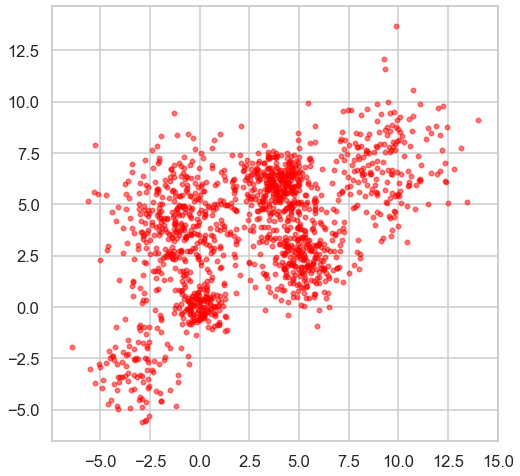

In [4]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

In [5]:
df_copy = np.NaN

def GUC_Kmean(Data_points, Number_of_Clusters):
    global df_copy
    
    df_copy = Data_points.copy()
    
    kmeans = KMeans(n_clusters=Number_of_Clusters).fit(Data_points)
    labels = kmeans.labels_
    df_copy['cluster'] = labels
    
    return kmeans

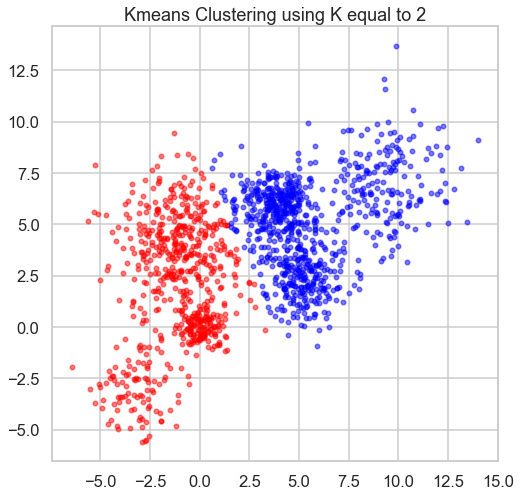

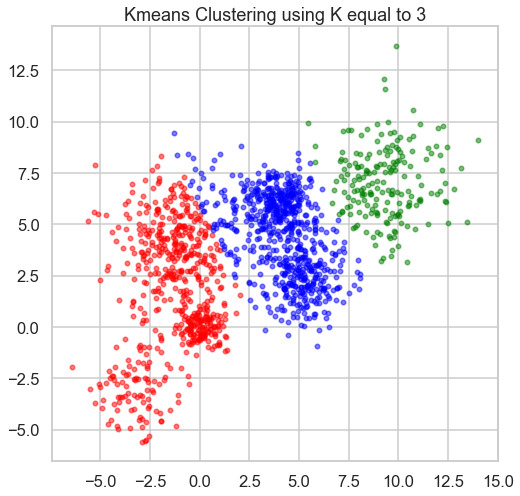

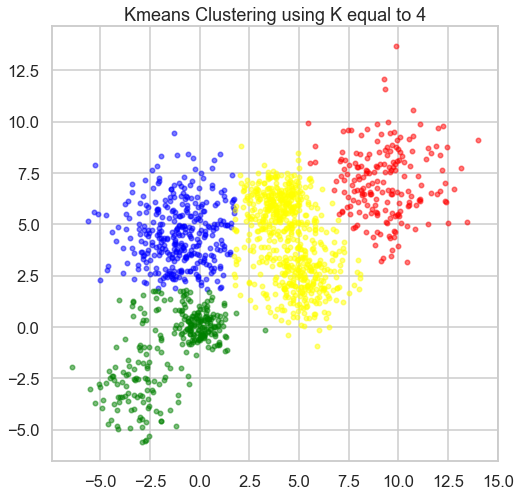

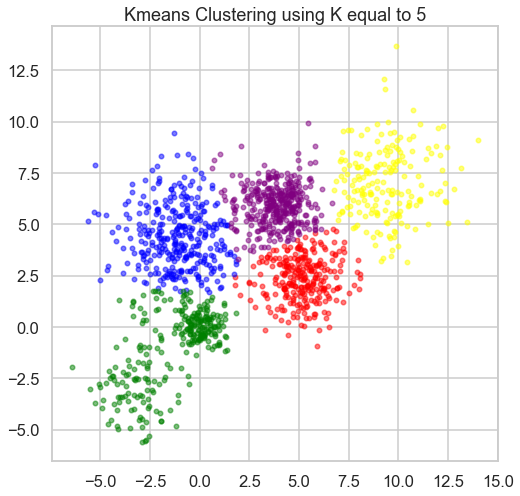

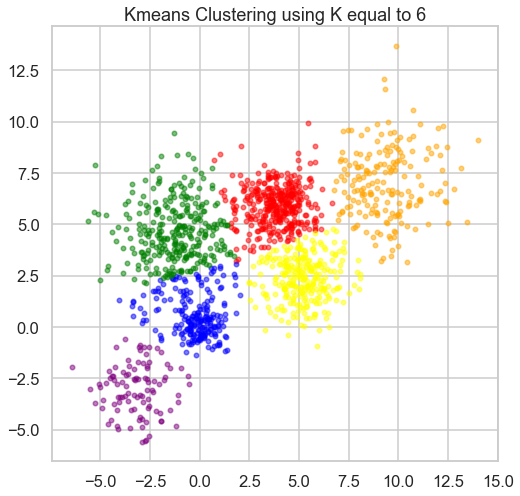

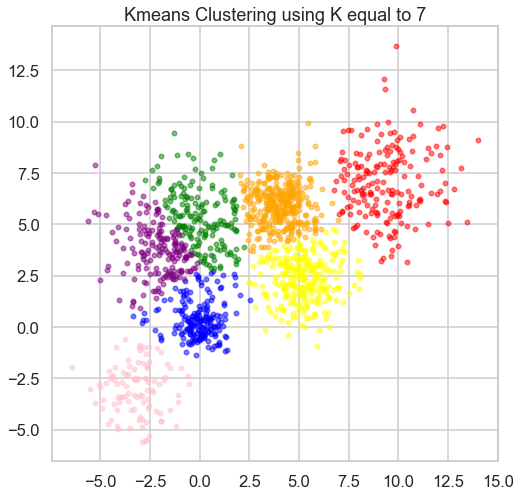

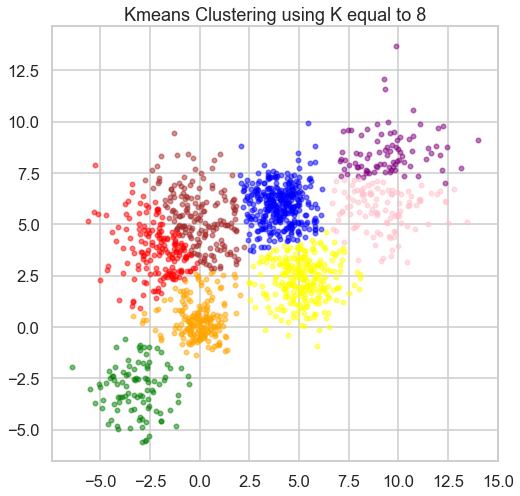

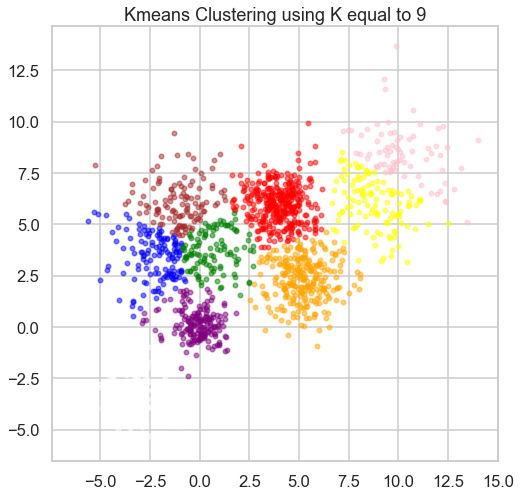

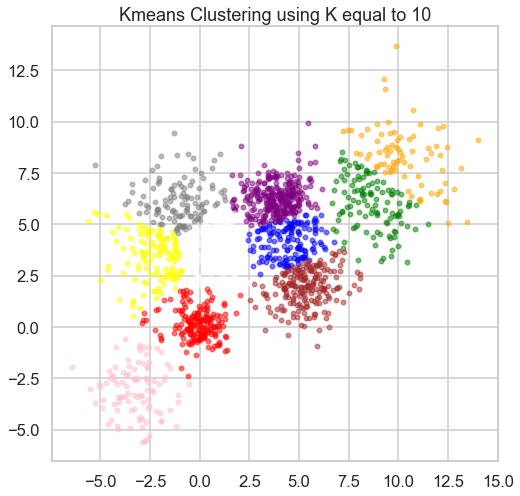

In [6]:
Kmeans_output = []

for i in range(2,11):
    km = GUC_Kmean(pd.DataFrame(Multi_blob_Data), i)
    
    plt.figure()
    plt.title(f'Kmeans Clustering using K equal to {i}')
    display_cluster(df_copy.to_numpy(copy=True), km, i)
    
    Kmeans_output.append(km)

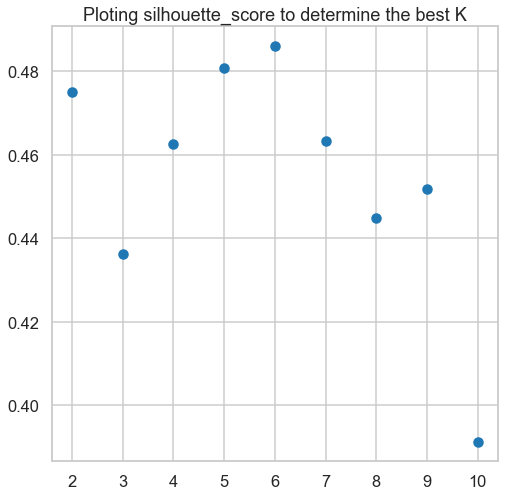

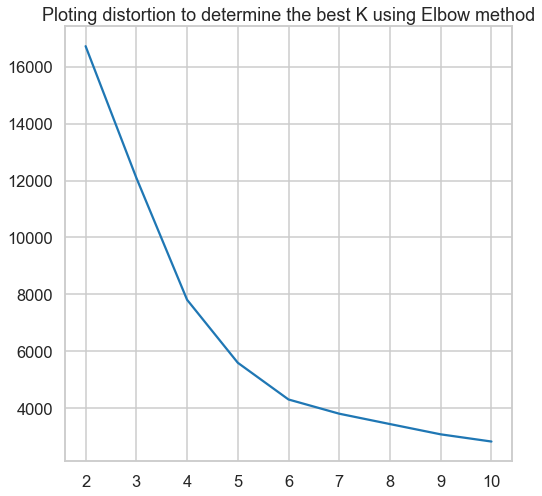

In [7]:
distortion = []
sil_score = []

for i in range(2,11):
    sil_score.append(silhouette_score(pd.DataFrame(Multi_blob_Data), Kmeans_output[i-2].labels_))
    distortion.append(Kmeans_output[i-2].inertia_)

plt.figure()
plt.title(f'Ploting silhouette_score to determine the best K')
plt.scatter(range(2,11), sil_score)

plt.figure()
plt.title('Ploting distortion to determine the best K using Elbow method')
plt.plot(range(2,11), distortion)

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

In [8]:
def plot_Agglomerative(aff, link, dist, model, df, cluster_num, flag):
    if flag:
        plt.figure()
        plt.title(f'Dendrogram using {aff} for Affininty, and {link} for Linkage type')
        Z = linkage(df, method=link, metric=aff)
        dendrogram(Z, p=dist)
        plt.show()
    
    plt.figure()
    plt.title(f'Hierarchal Clustering using {aff} for Affininty, and {link} for Linkage type and distance thershold = {dist}')
    display_cluster(df.to_numpy(copy=True), model, cluster_num)

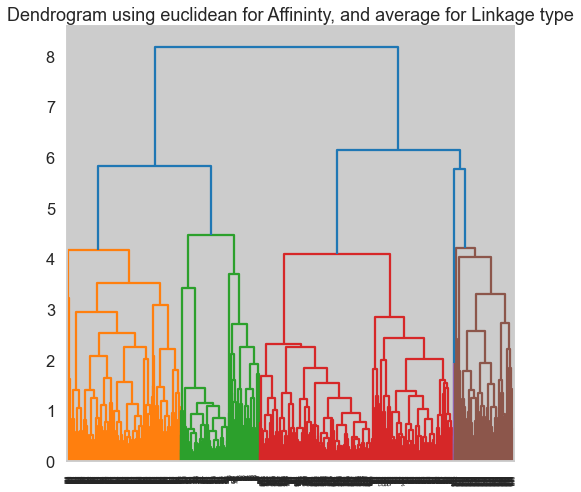

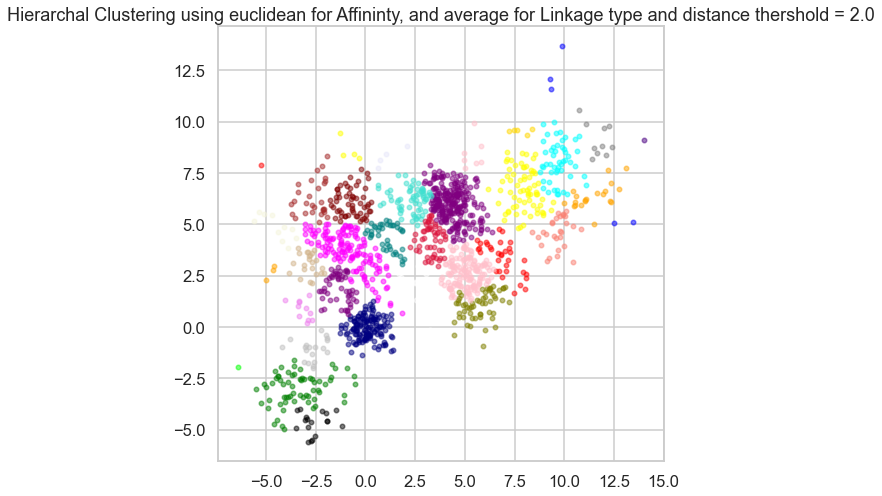

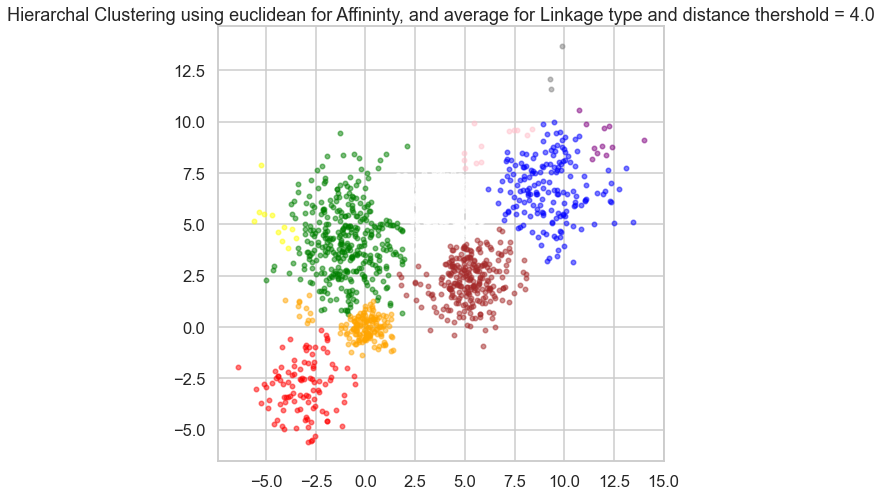

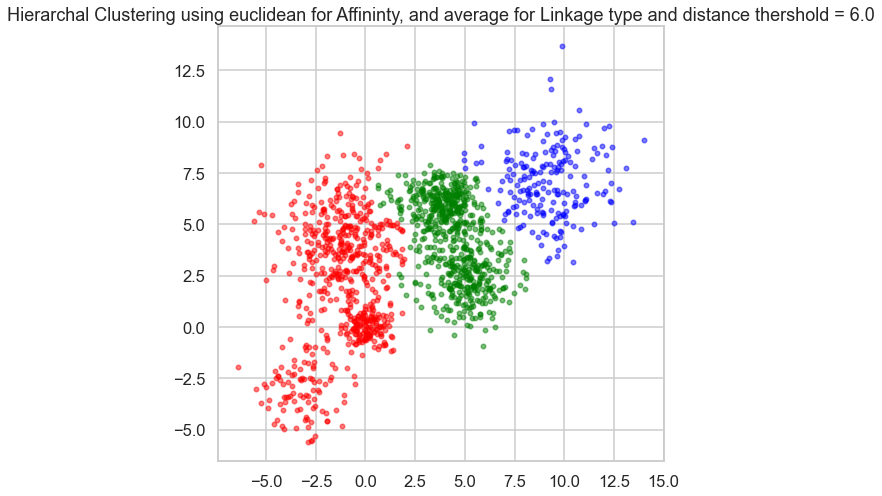

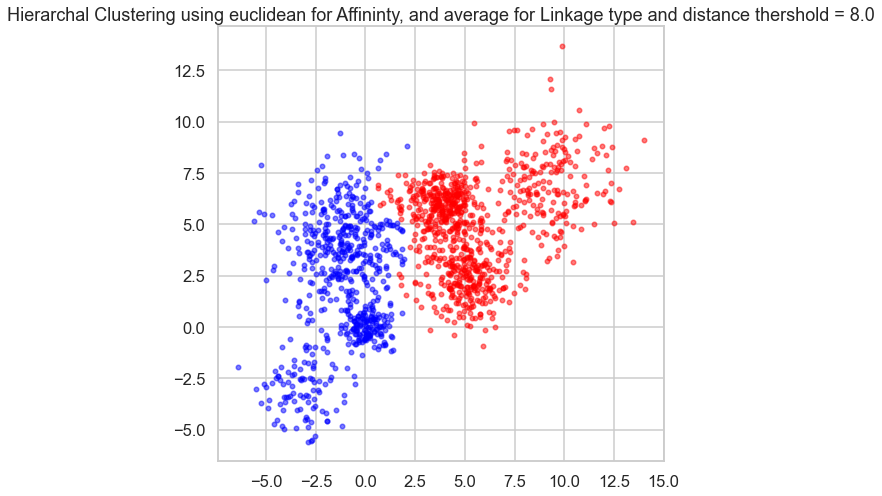

...

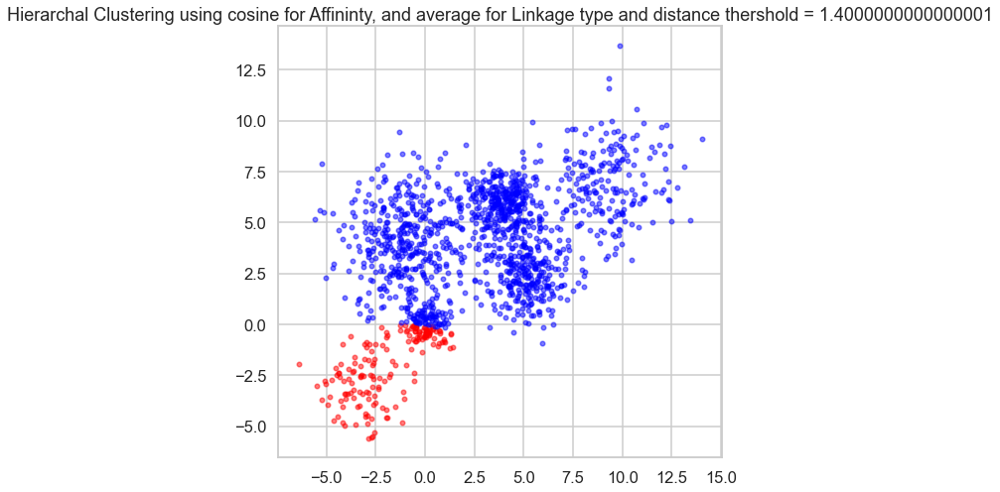

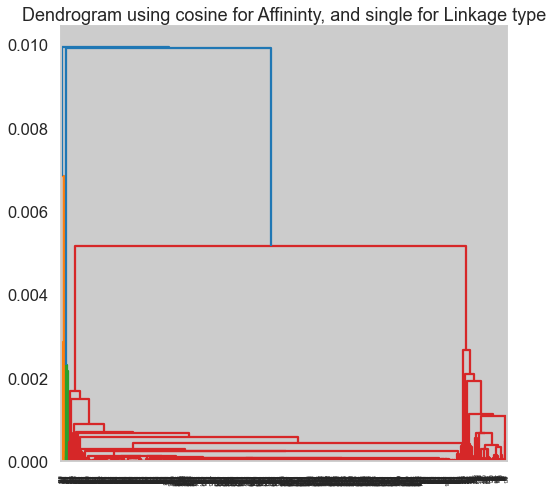

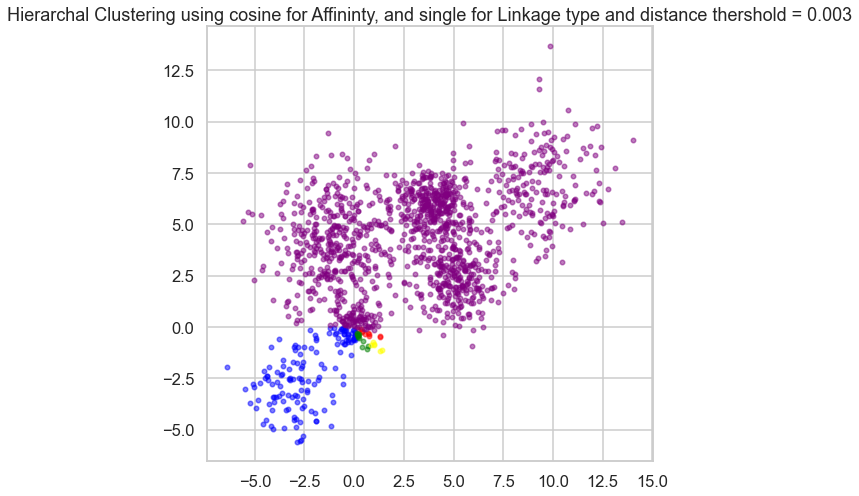

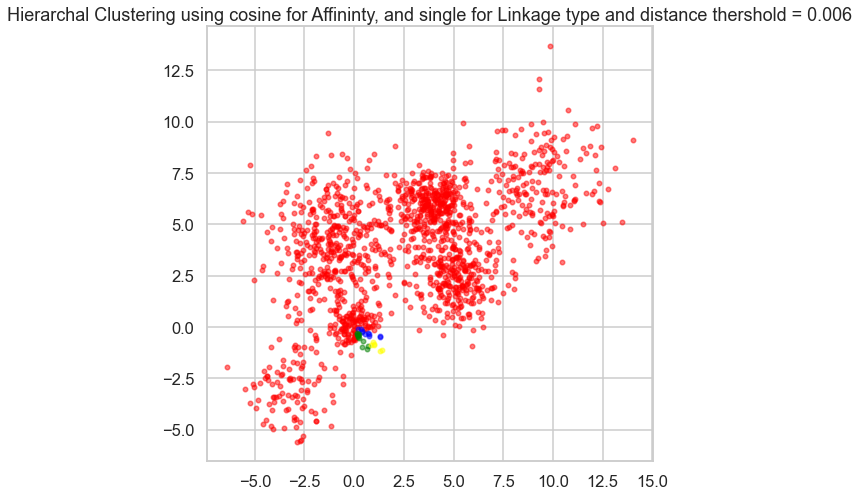

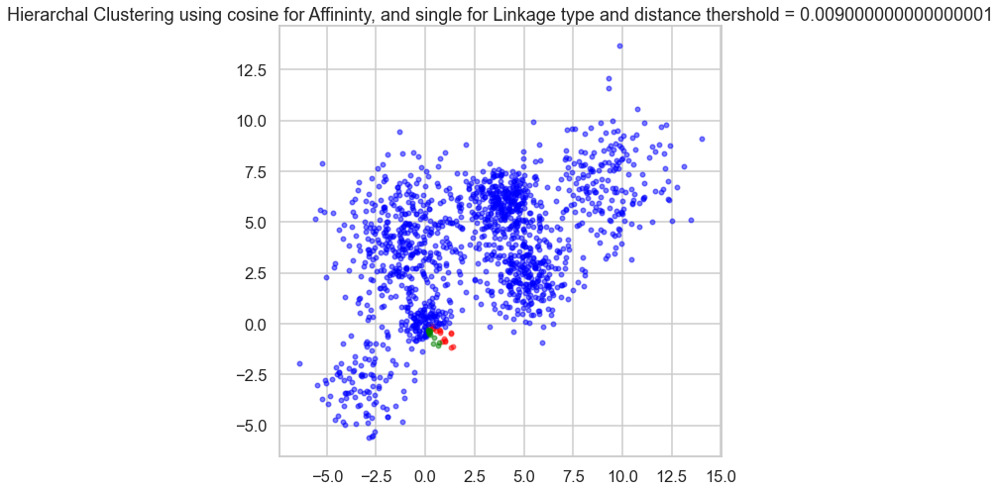

In [9]:
for aff in ['euclidean']:
    for link in ['average', 'single']:
        model = np.NaN
        if link == 'average':
            flag = True
            for dist in np.arange(2,10,2):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(pd.DataFrame(Multi_blob_Data))
                plot_Agglomerative(aff, link, float(dist), model, pd.DataFrame(Multi_blob_Data), len(np.unique(model.labels_)), flag)
                flag = False
            
        elif link == 'single':
            flag = True
            for dist in np.arange(1,2,0.2):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(pd.DataFrame(Multi_blob_Data))
                plot_Agglomerative(aff, link, float(dist), model, pd.DataFrame(Multi_blob_Data), len(np.unique(model.labels_)), flag)
                flag = False

for aff in ['cosine']:
    for link in ['average', 'single']:
        model = np.NaN
        if link == 'average':
            flag = True
            for dist in np.arange(0.2,1.6,0.4):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(pd.DataFrame(Multi_blob_Data))
                plot_Agglomerative(aff, link, float(dist), model, pd.DataFrame(Multi_blob_Data), len(np.unique(model.labels_)), flag)
                flag = False
            
        elif link == 'single':
            flag = True
            for dist in np.arange(0.003,0.01,0.003):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(pd.DataFrame(Multi_blob_Data))
                plot_Agglomerative(aff, link, float(dist), model, pd.DataFrame(Multi_blob_Data), len(np.unique(model.labels_)), flag)
                flag = False

### DBScan
* Use DBScan function to  to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

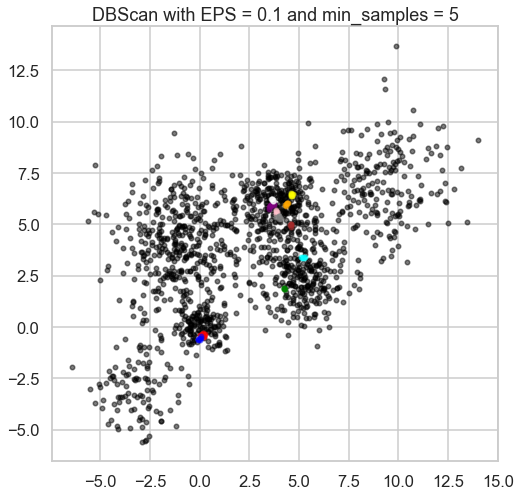

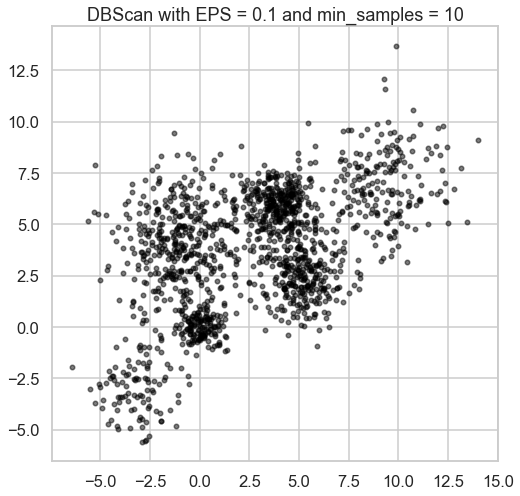

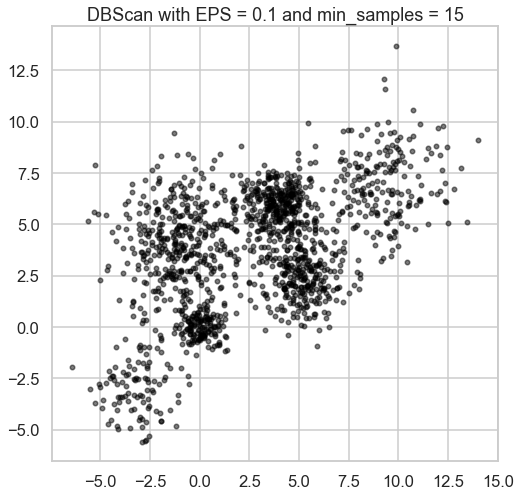

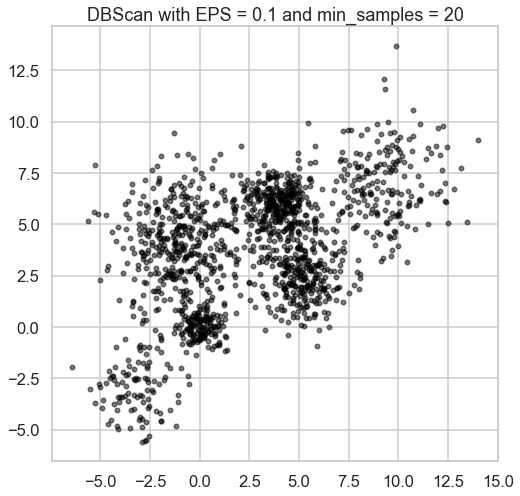

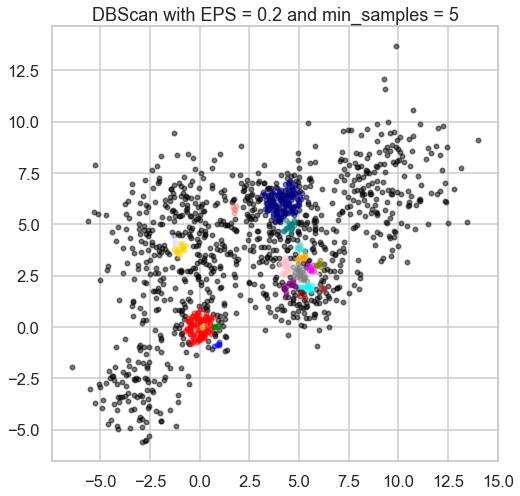

...

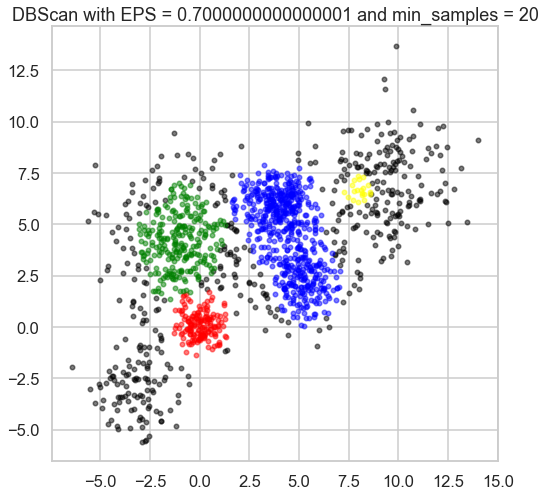

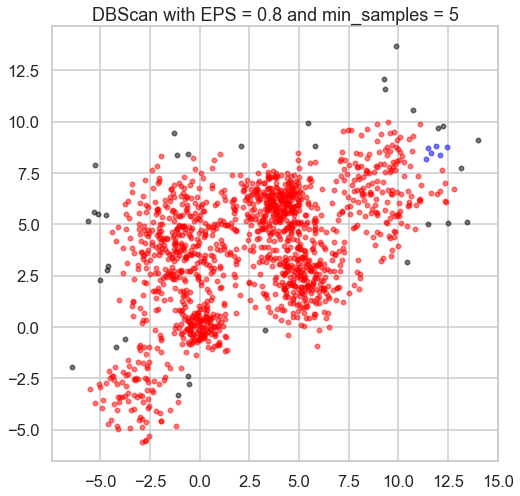

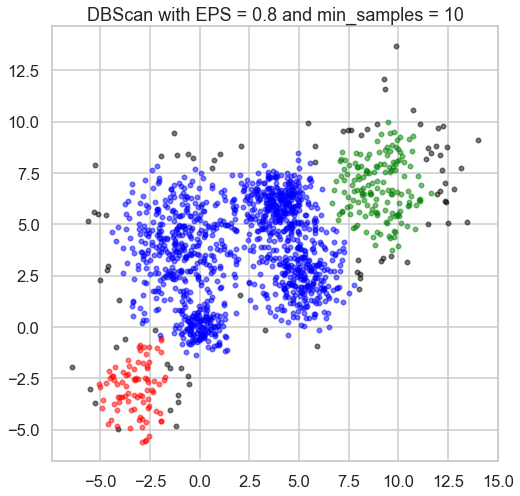

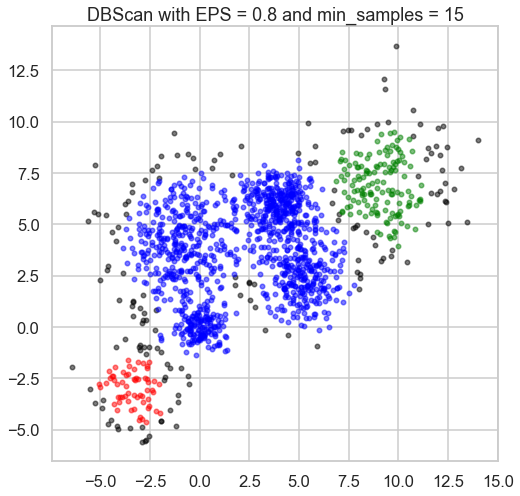

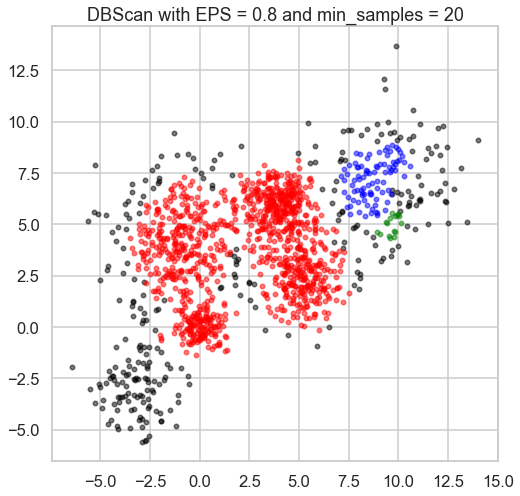

In [10]:
EPS_range = np.arange(0.1, 0.9, 0.1)
min_smaples_range = np.arange(5, 25, 5)

for EPS in EPS_range:
    for min_sample in min_smaples_range:
        dbscan = DBSCAN(eps=EPS, min_samples=min_sample)
        dbscan.fit(pd.DataFrame(Multi_blob_Data))
        
        plt.figure()
        plt.title(f'DBScan with EPS = {EPS} and min_samples = {min_sample}')
        display_cluster(Multi_blob_Data, dbscan, 20)

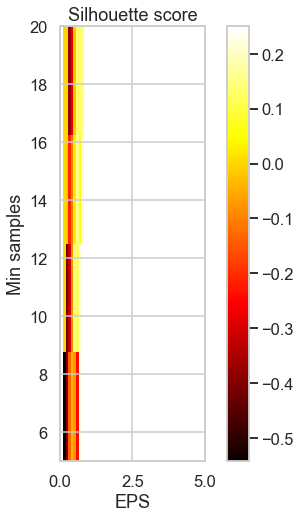

In [11]:

silhouette_scores = np.zeros((len(EPS_range), len(min_smaples_range)))

for i, eps in enumerate(EPS_range):
    for j, min_samples in enumerate(min_smaples_range):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(pd.DataFrame(Multi_blob_Data))
        if len(set(labels)) > 1:  # Silhouette score is undefined for a single cluster
            silhouette_scores[i, j] = silhouette_score(pd.DataFrame(Multi_blob_Data), labels)

# Create a heatmap of silhouette scores
fig, ax = plt.subplots()
plt.imshow(silhouette_scores.T, cmap='hot', interpolation='nearest', origin='lower', extent=[EPS_range[0], EPS_range[-1], min_smaples_range[0], min_smaples_range[-1]])
plt.colorbar()
plt.xlabel('EPS')
plt.ylabel('Min samples')
plt.title('Silhouette score')
ax.set_xlim([0, 5])
plt.show()

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

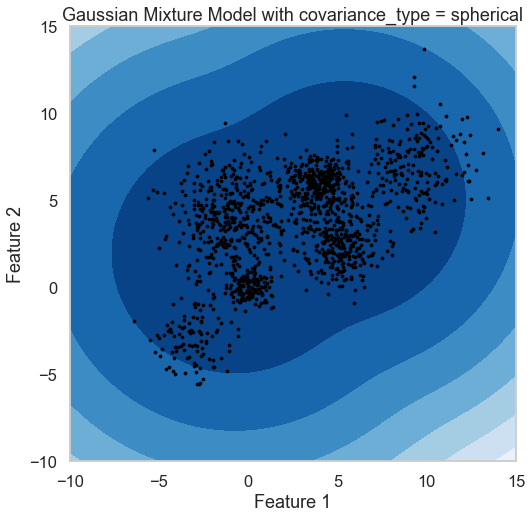

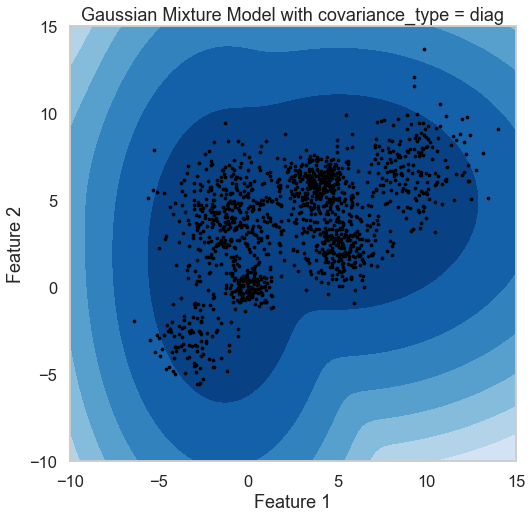

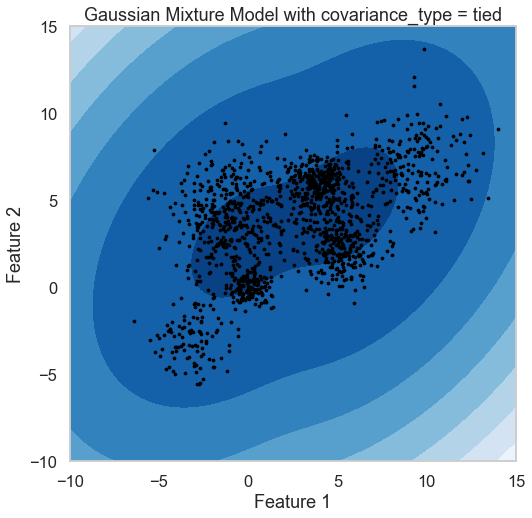

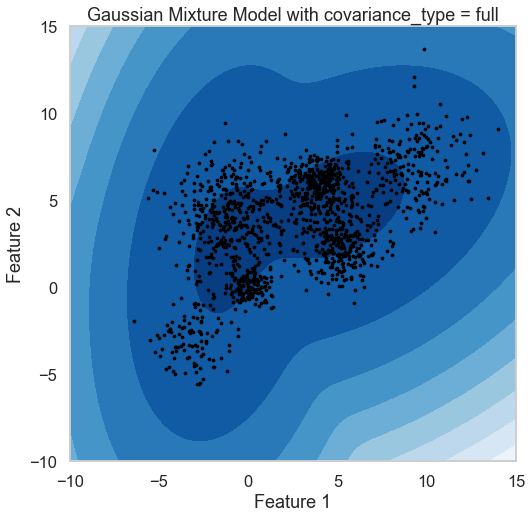

In [12]:
for type in ['spherical', 'diag', 'tied', 'full']:
    # Fit GMM to the data
    n_components = 2
    gmm = GaussianMixture(n_components=n_components, covariance_type=type, random_state=0)
    gmm.fit(pd.DataFrame(Multi_blob_Data))

    # Define the grid for the contour plot
    x_min, x_max = -10, 15
    y_min, y_max = -10, 15
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    Z = -gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Create the contour plot
    plt.contourf(xx, yy, Z, cmap=plt.cm.Blues_r)
    plt.scatter(Multi_blob_Data[:, 0], Multi_blob_Data[:, 1], s=5, color='black')
    plt.title(f'Gaussian Mixture Model with covariance_type = {type}')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


In [13]:
import json

In [14]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
['setosa', 'versicolor', 'virginica']


['setosa', 'versicolor', 'virginica']

In [15]:
df_iris = pd.DataFrame(data= np.c_[iris_data['data'], iris_data['target']],columns= iris_data['feature_names'] + ['target'])

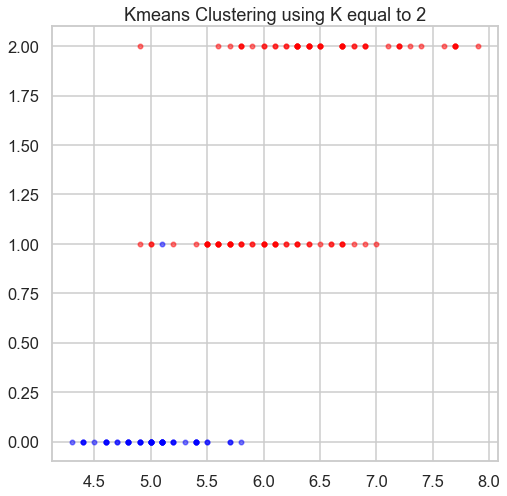

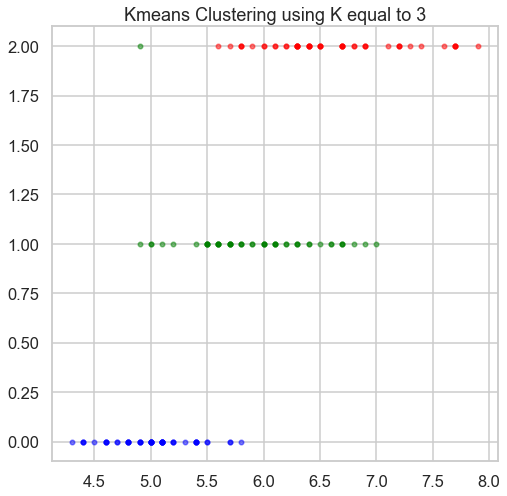

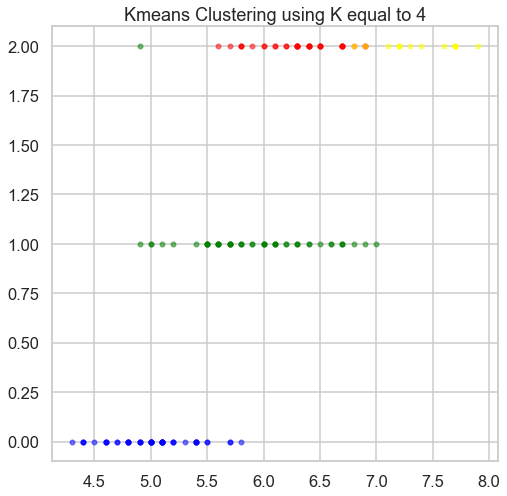

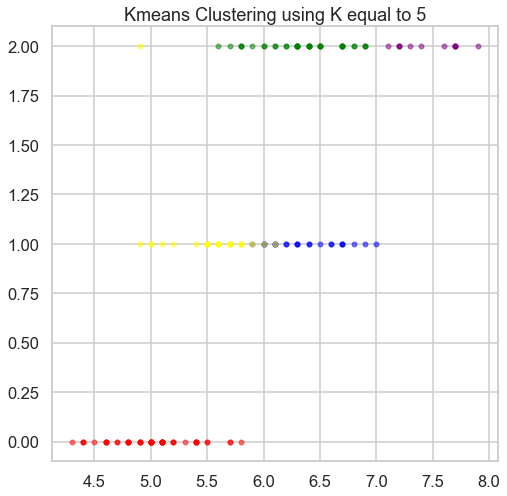

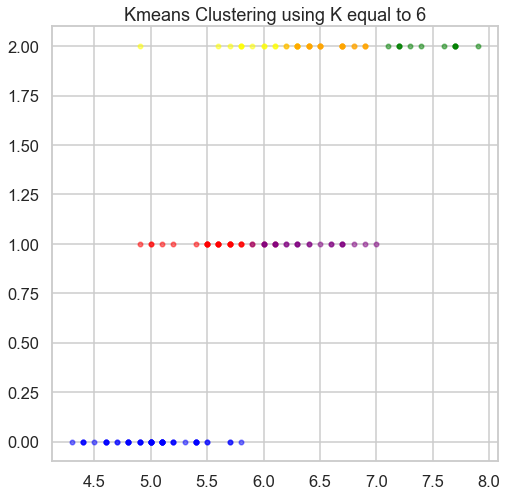

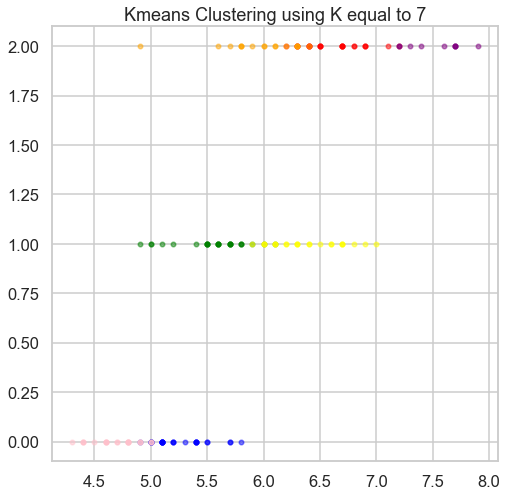

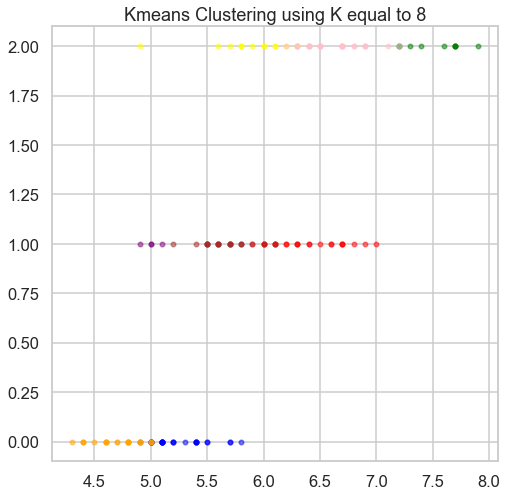

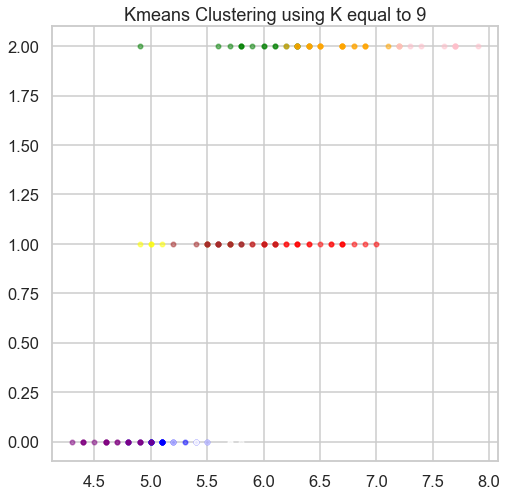

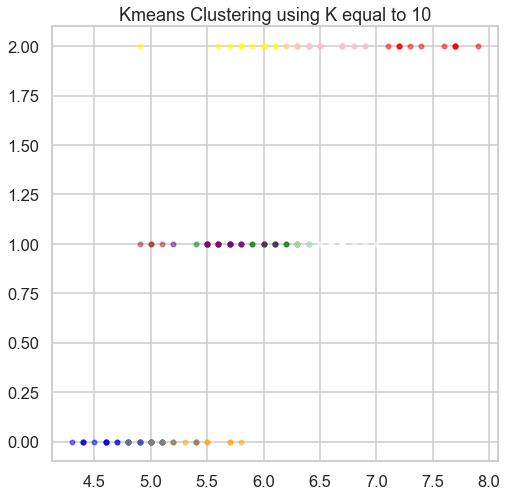

In [16]:
Kmeans_output = []

for i in range(2,11):
    km = GUC_Kmean(df_iris, i)
    
    plt.figure()
    plt.title(f'Kmeans Clustering using K equal to {i}')
    display_cluster(df_copy[['sepal length (cm)', 'target']].to_numpy(copy=True), km, i)
    
    Kmeans_output.append(km)

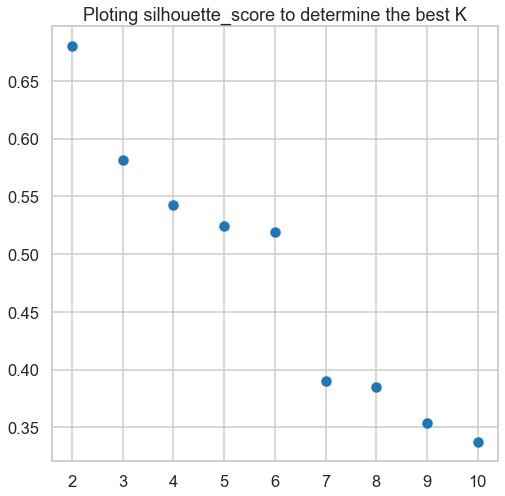

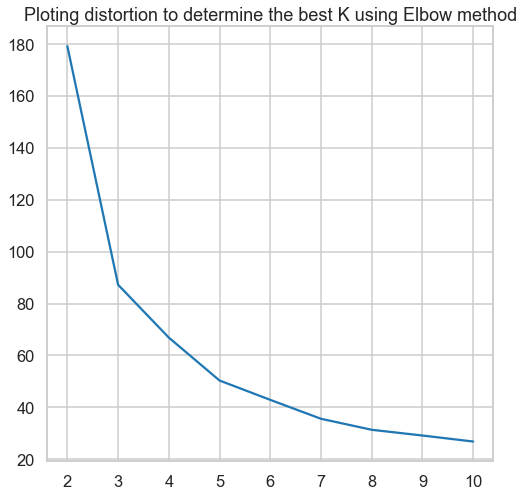

In [17]:
distortion = []
sil_score = []

for i in range(2,11):
    sil_score.append(silhouette_score(df_iris, Kmeans_output[i-2].labels_))
    distortion.append(Kmeans_output[i-2].inertia_)

plt.figure()
plt.title(f'Ploting silhouette_score to determine the best K')
plt.scatter(range(2,11), sil_score)

plt.figure()
plt.title('Ploting distortion to determine the best K using Elbow method')
plt.plot(range(2,11), distortion)

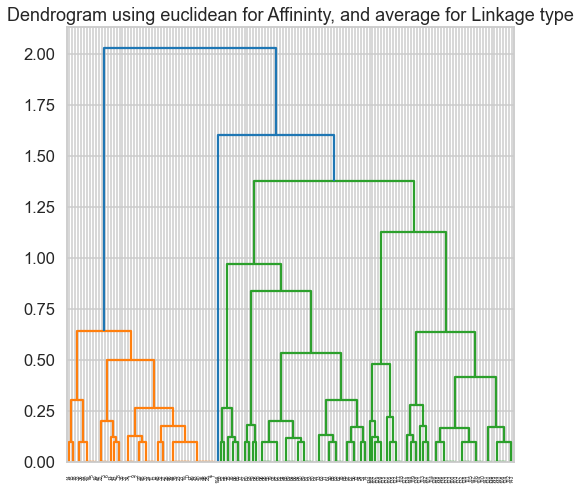

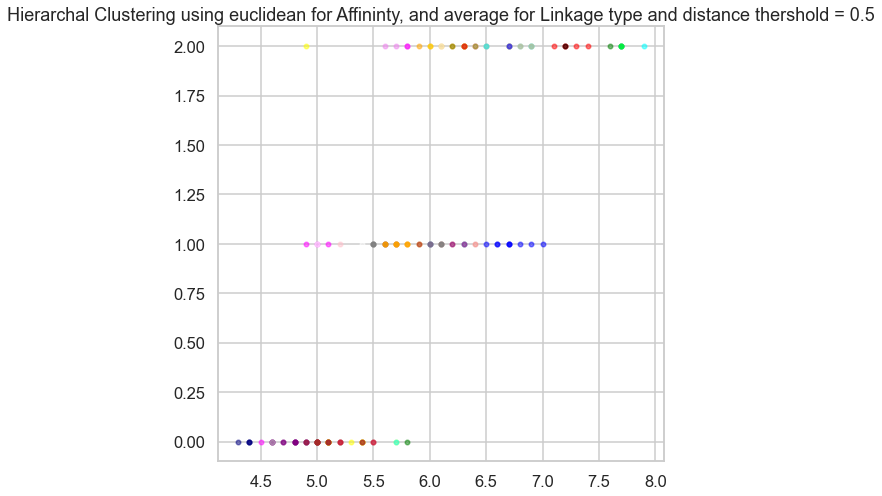

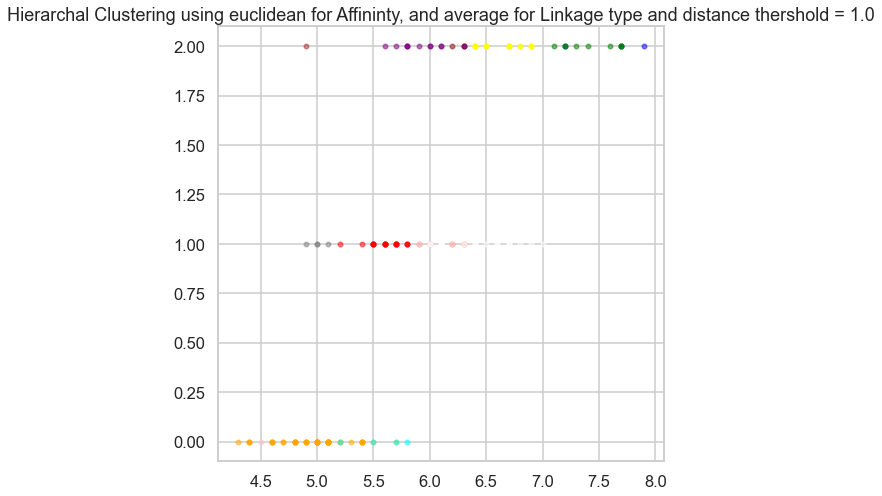

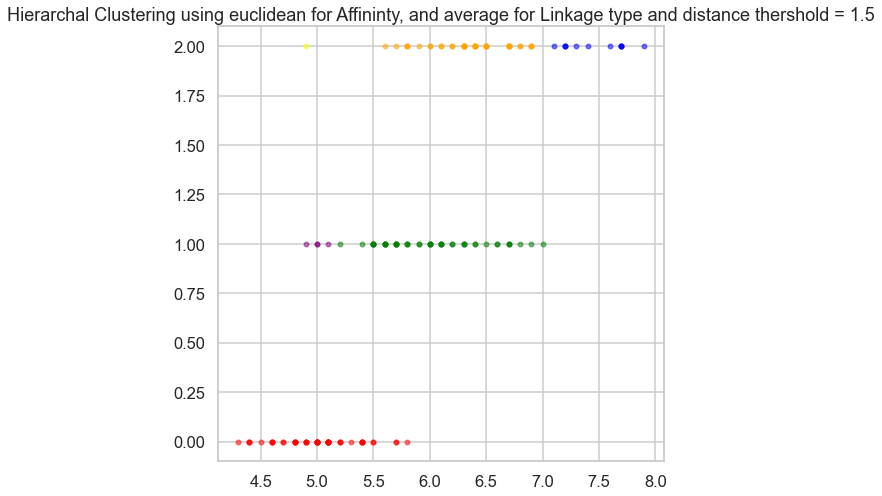

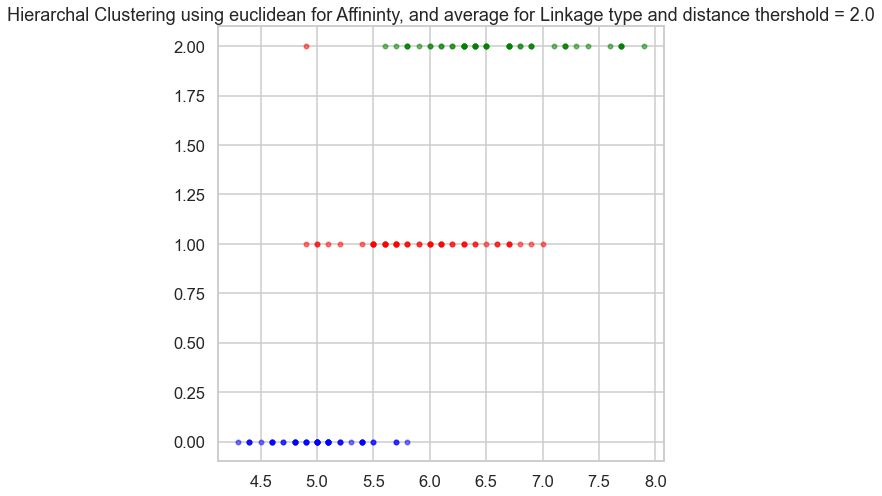

...

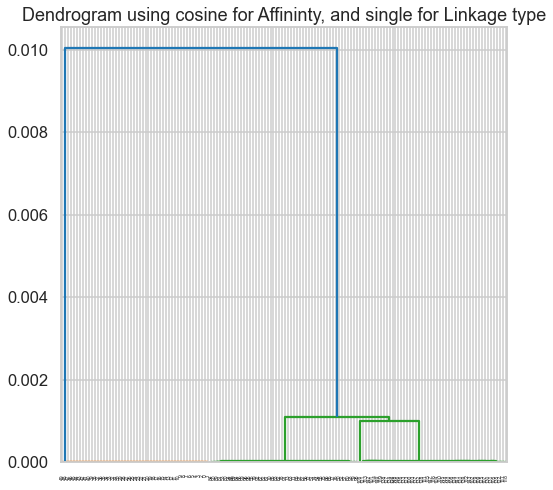

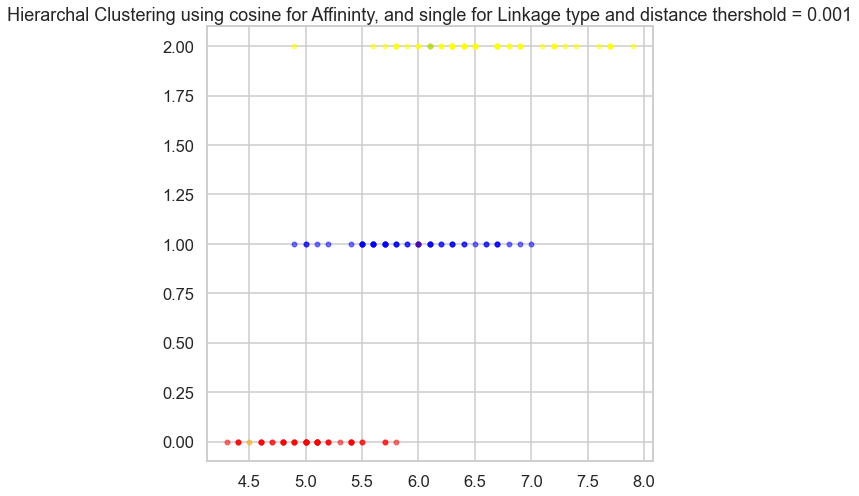

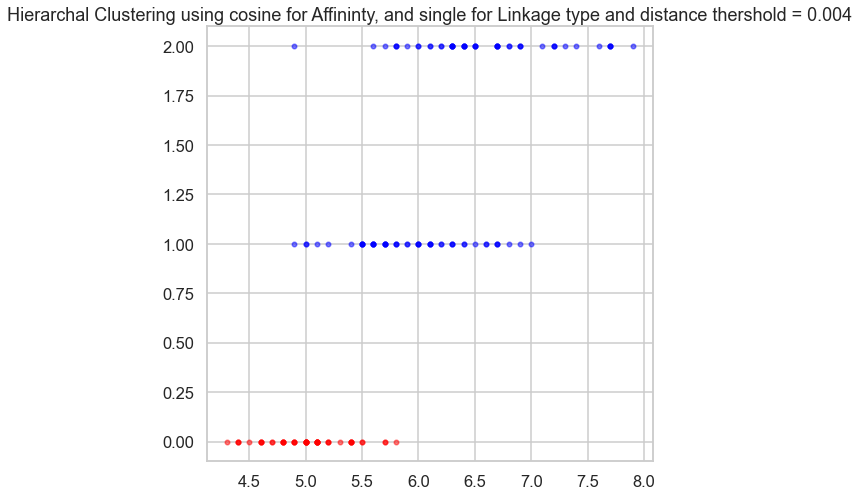

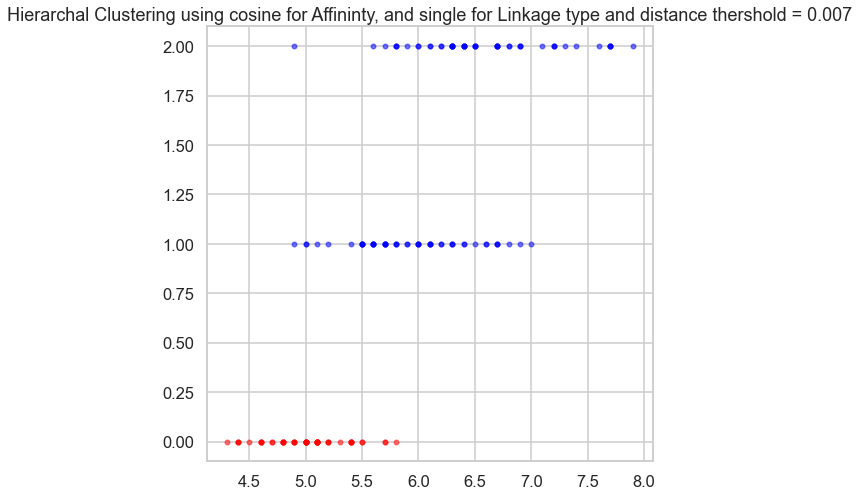

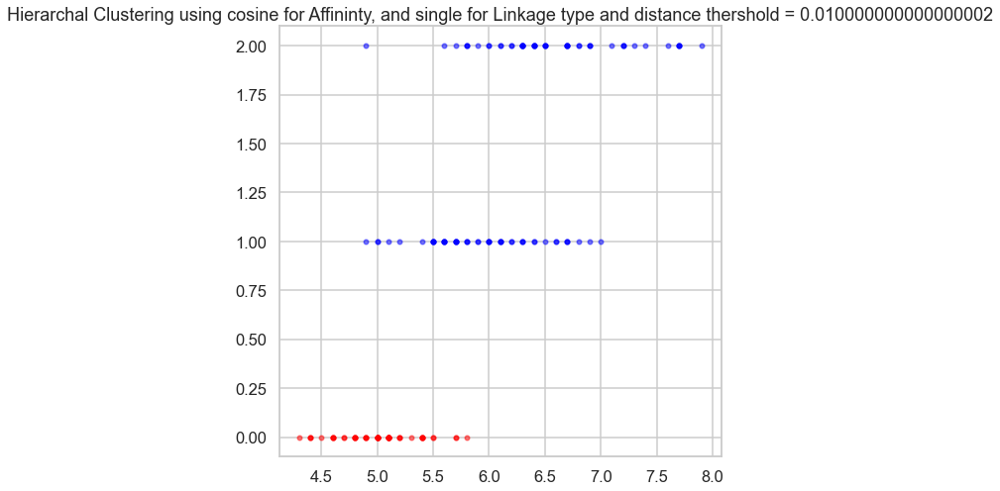

In [18]:
for aff in ['euclidean']:
    for link in ['average', 'single']:
        model = np.NaN
        if link == 'average':
            flag = True
            for dist in np.arange(0.5,2.5,0.5):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_iris)
                plot_Agglomerative(aff, link, float(dist), model, df_iris[['sepal length (cm)', 'target']], len(np.unique(model.labels_)), flag)
                flag = False
            
        elif link == 'single':
            flag = True
            for dist in np.arange(0.2,1,0.2):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_iris)
                plot_Agglomerative(aff, link, float(dist), model, df_iris[['sepal length (cm)', 'target']], len(np.unique(model.labels_)), flag)
                flag = False

for aff in ['cosine']:
    for link in ['average', 'single']:
        model = np.NaN
        if link == 'average':
            flag = True
            for dist in np.arange(0.002,0.015,0.005):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_iris)
                plot_Agglomerative(aff, link, float(dist), model, df_iris[['sepal length (cm)', 'target']], len(np.unique(model.labels_)), flag)
                flag = False
            
        elif link == 'single':
            flag = True
            for dist in np.arange(0.001,0.01,0.003):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_iris)
                plot_Agglomerative(aff, link, float(dist), model, df_iris[['sepal length (cm)', 'target']], len(np.unique(model.labels_)), flag)
                flag = False

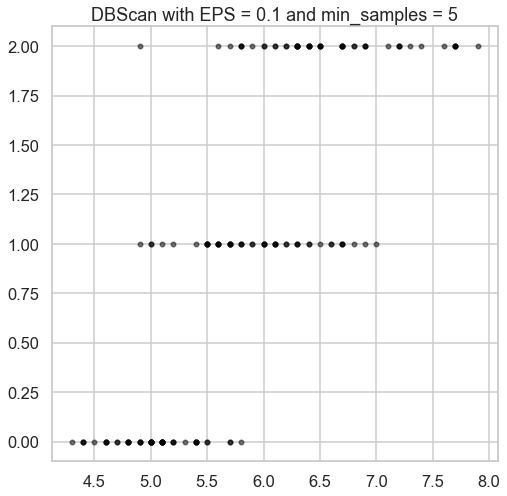

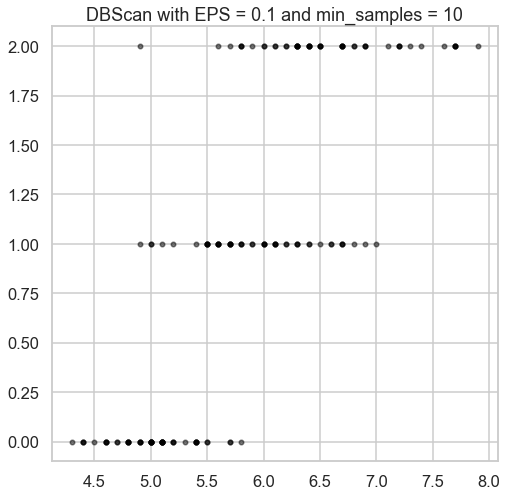

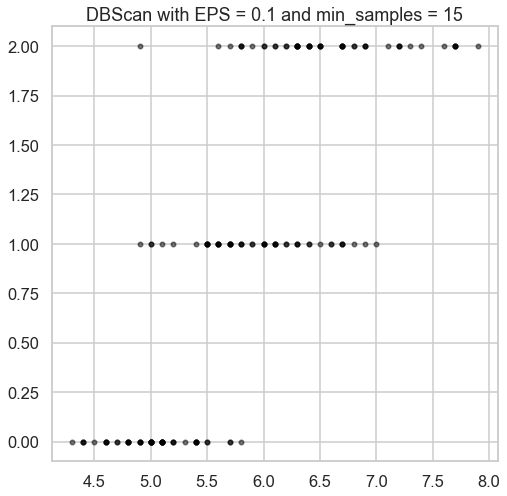

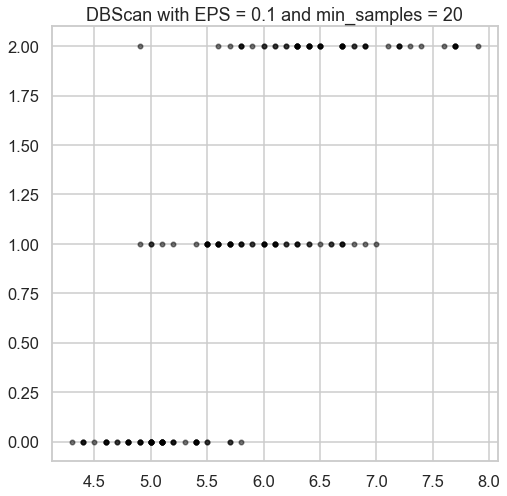

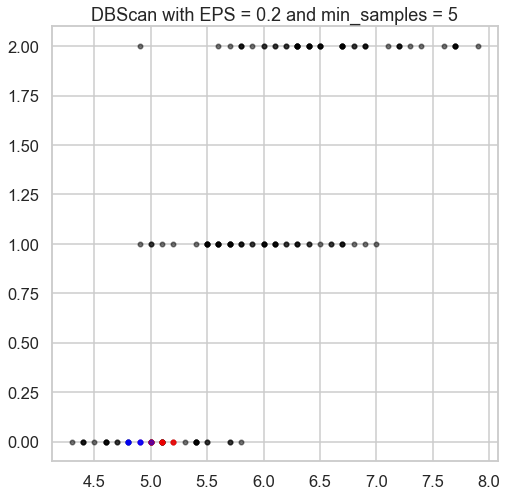

...

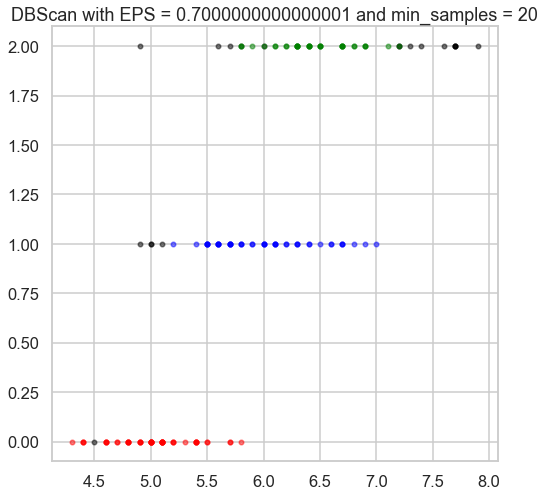

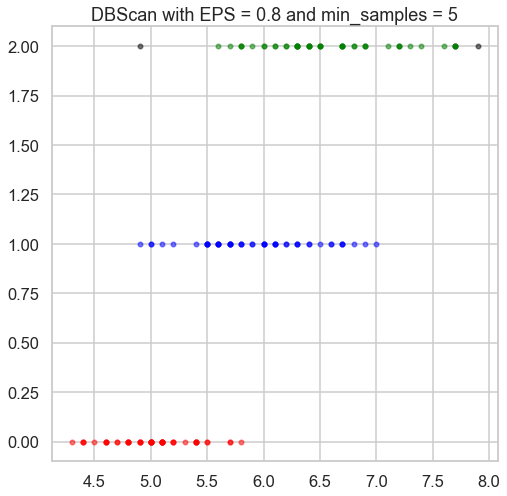

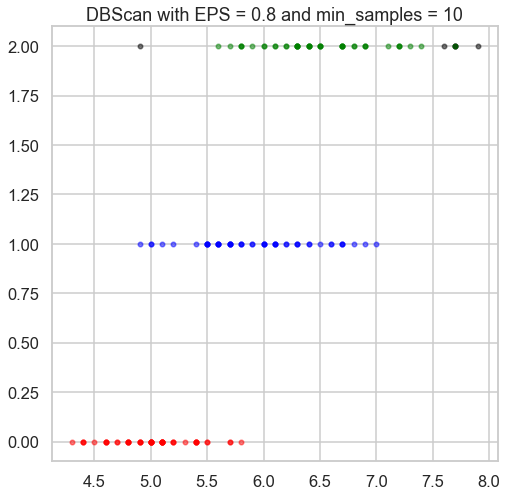

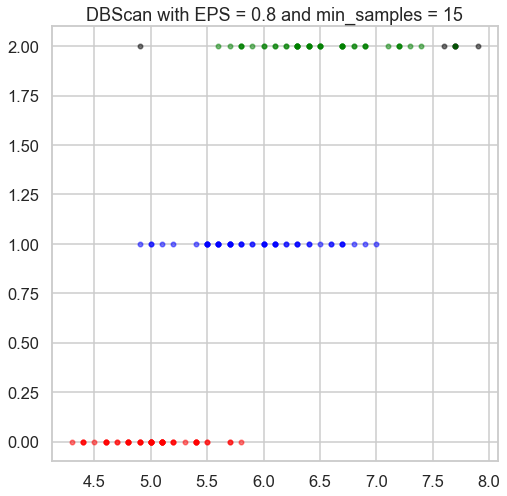

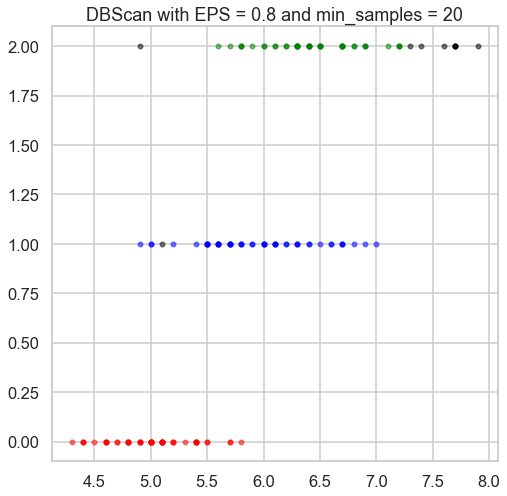

In [19]:
EPS_range = np.arange(0.1, 0.9, 0.1)
min_smaples_range = np.arange(5, 25, 5)

for EPS in EPS_range:
    for min_sample in min_smaples_range:
        dbscan = DBSCAN(eps=EPS, min_samples=min_sample)
        dbscan.fit(df_iris)
        
        plt.figure()
        plt.title(f'DBScan with EPS = {EPS} and min_samples = {min_sample}')
        display_cluster(df_iris[['sepal length (cm)', 'target']].to_numpy(copy=True), dbscan, 20)

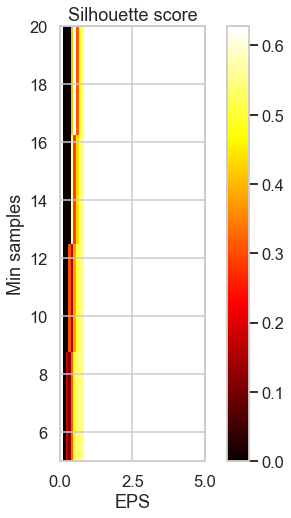

In [20]:
silhouette_scores = np.zeros((len(EPS_range), len(min_smaples_range)))

for i, eps in enumerate(EPS_range):
    for j, min_samples in enumerate(min_smaples_range):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(df_iris)
        if len(set(labels)) > 1:  # Silhouette score is undefined for a single cluster
            silhouette_scores[i, j] = silhouette_score(df_iris, labels)

# Create a heatmap of silhouette scores
fig, ax = plt.subplots()
plt.imshow(silhouette_scores.T, cmap='hot', interpolation='nearest', origin='lower', extent=[EPS_range[0], EPS_range[-1], min_smaples_range[0], min_smaples_range[-1]])
plt.colorbar()
plt.xlabel('EPS')
plt.ylabel('Min samples')
plt.title('Silhouette score')
ax.set_xlim([0, 5])
plt.show()

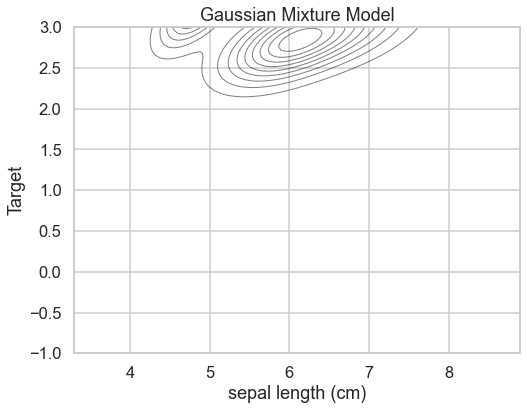

In [21]:
gmm = GaussianMixture(n_components=3)
gmm.fit(df_iris)

# create a grid of points to evaluate the PDFs
x_min, x_max = df_iris.to_numpy(copy=True)[:, 0].min() - 1, df_iris.to_numpy(copy=True)[:, 0].max() + 1
y_min, y_max = df_iris.to_numpy(copy=True)[:, -1].min() - 1, df_iris.to_numpy(copy=True)[:, -1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# calculate the PDF of each component and the total mixture
Z = np.zeros((xx.shape[0], xx.shape[1]))
for i in range(gmm.n_components):
    # calculate the PDF of the i-th component
    mu = gmm.means_[i][:2]  # take the first two dimensions for plotting
    sigma = gmm.covariances_[i][:2, :2]  # take the first two dimensions for plotting
    rv = multivariate_normal(mu, sigma)
    Z += gmm.weights_[i] * rv.pdf(np.dstack((xx, yy)))

# plot the contours
plt.figure(figsize=(8, 6))
plt.contour(xx, yy, Z, levels=10, linewidths=1, colors='k', alpha=0.5)
plt.title('Gaussian Mixture Model')
plt.xlabel('sepal length (cm)')
plt.ylabel('Target')
plt.show()

# Normalize

In [22]:
scaler = StandardScaler()
df_iris_scaled = pd.DataFrame(scaler.fit_transform(df_iris))
df_iris_scaled.columns = ['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)','petal width (cm)', 'target']

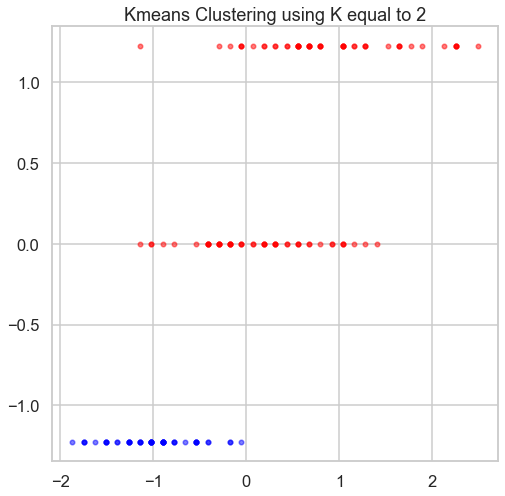

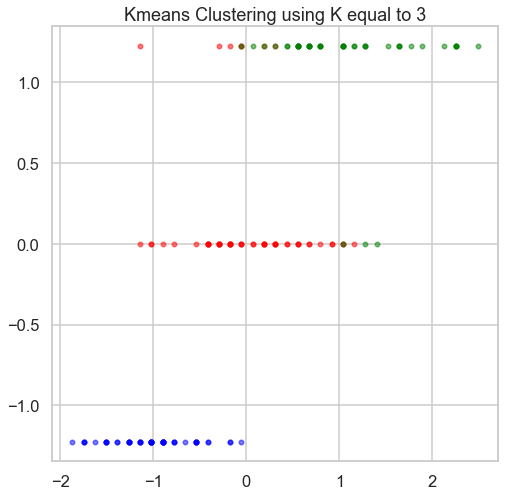

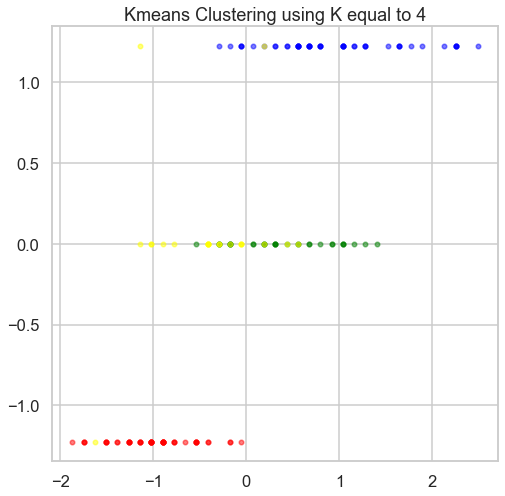

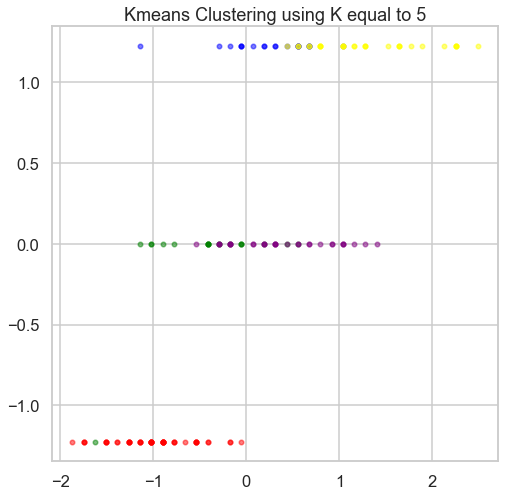

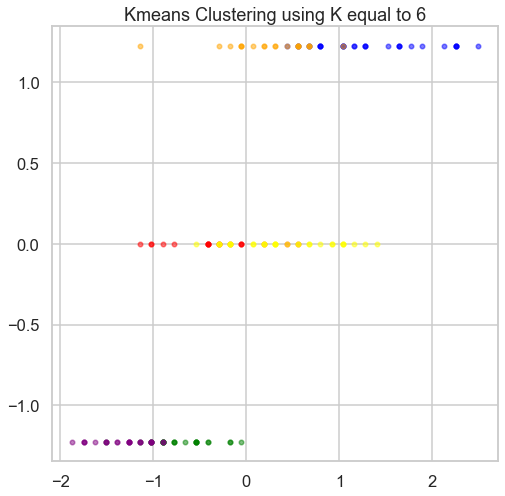

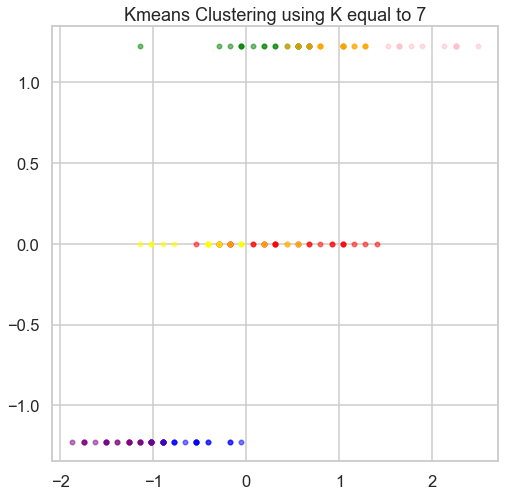

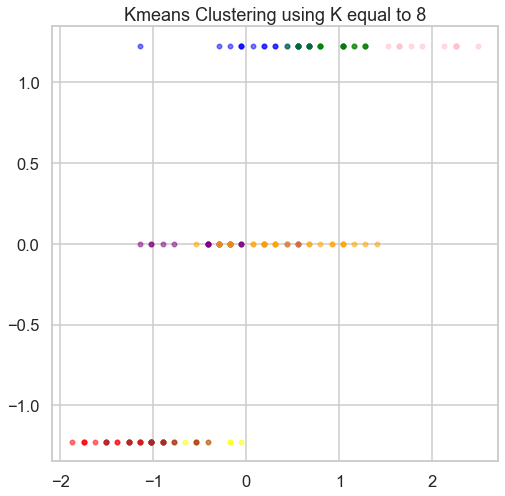

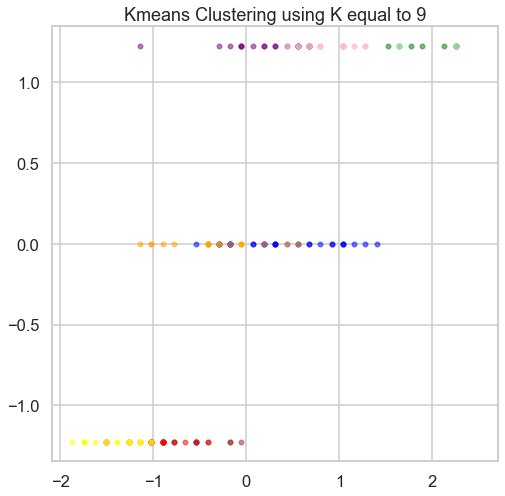

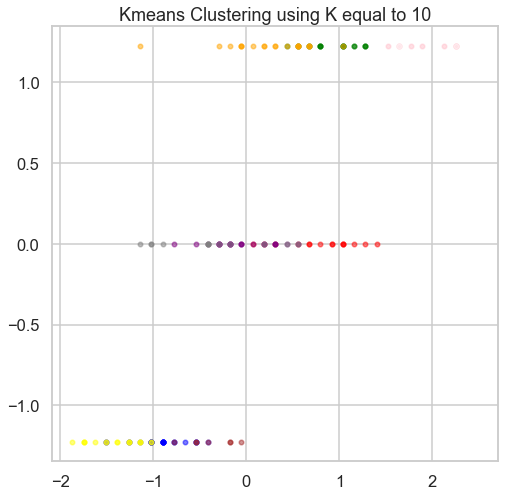

In [23]:
Kmeans_output = []

for i in range(2,11):
    km = GUC_Kmean(df_iris_scaled, i)
    
    plt.figure()
    plt.title(f'Kmeans Clustering using K equal to {i}')
    display_cluster(df_copy[['sepal length (cm)', 'target']].to_numpy(copy=True), km, i)
    
    Kmeans_output.append(km)

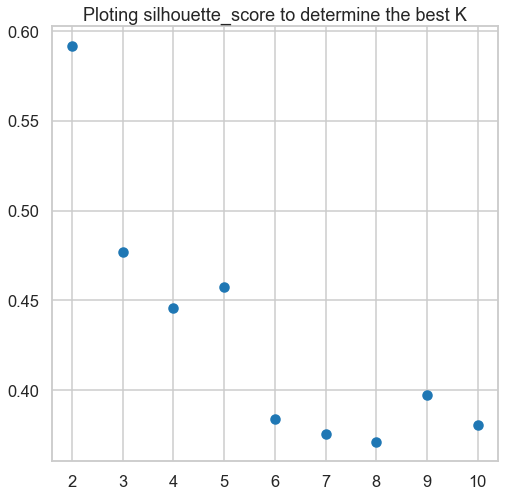

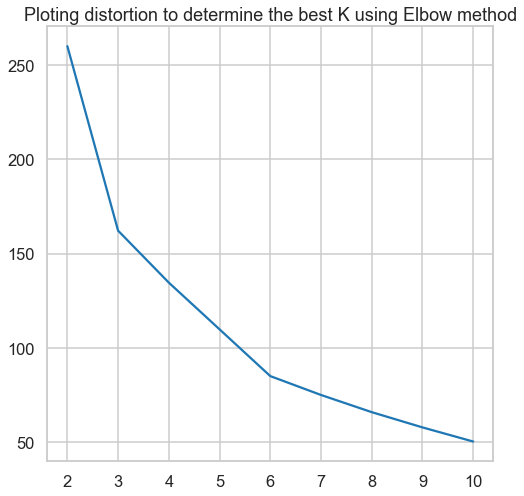

In [24]:
distortion = []
sil_score = []

for i in range(2,11):
    sil_score.append(silhouette_score(df_iris_scaled, Kmeans_output[i-2].labels_))
    distortion.append(Kmeans_output[i-2].inertia_)

plt.figure()
plt.title(f'Ploting silhouette_score to determine the best K')
plt.scatter(range(2,11), sil_score)

plt.figure()
plt.title('Ploting distortion to determine the best K using Elbow method')
plt.plot(range(2,11), distortion)

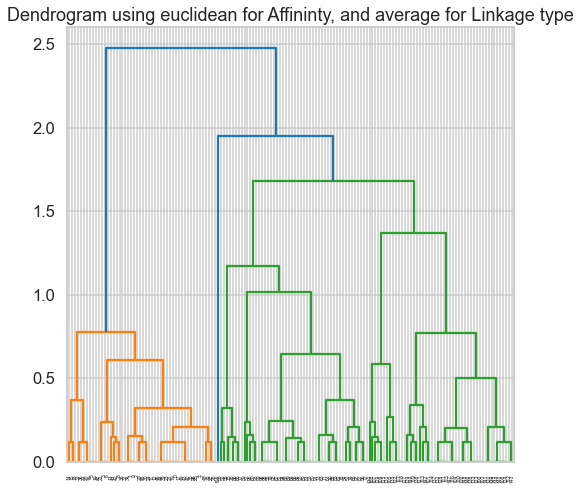

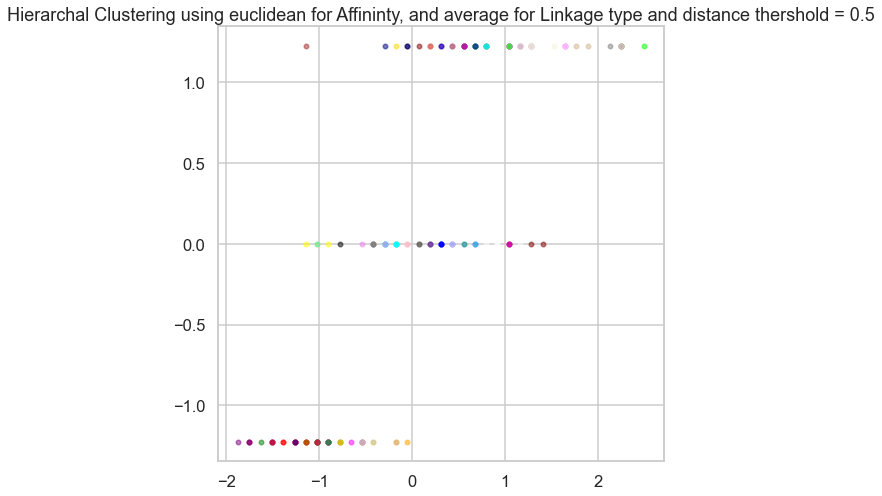

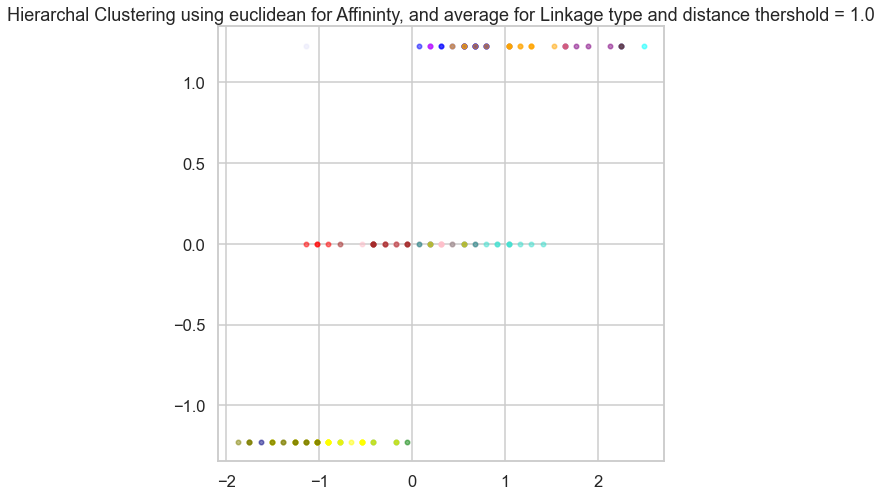

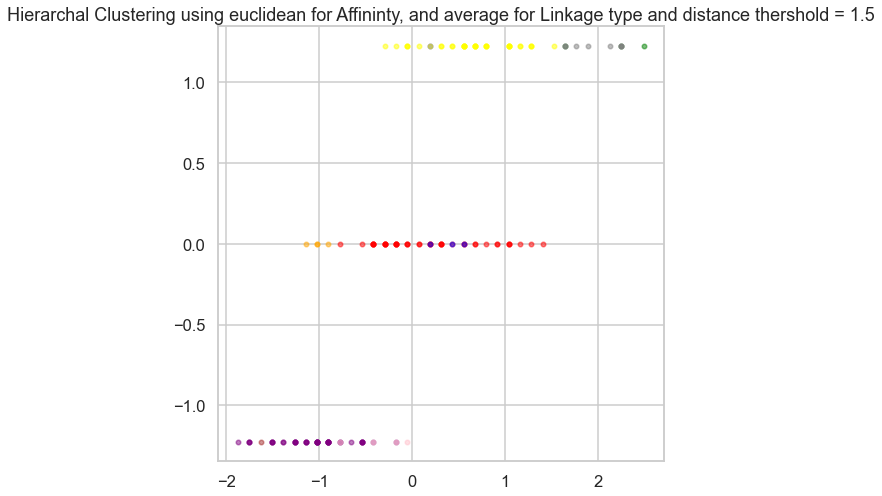

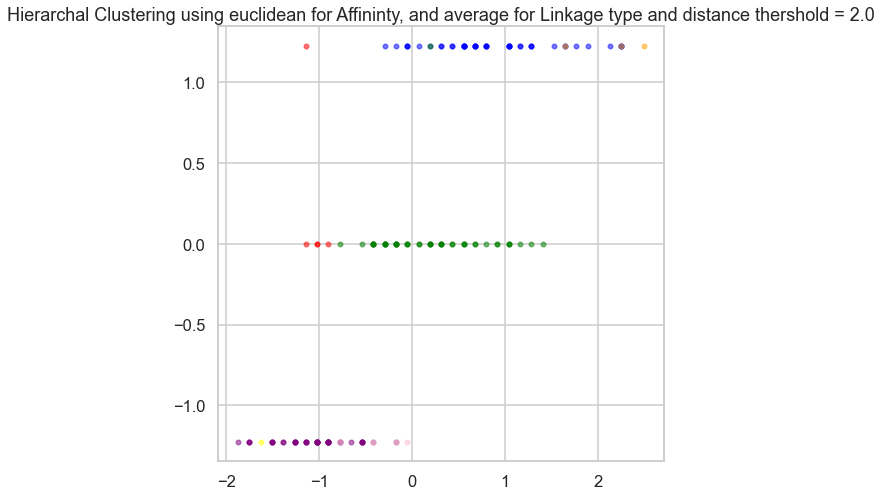

...

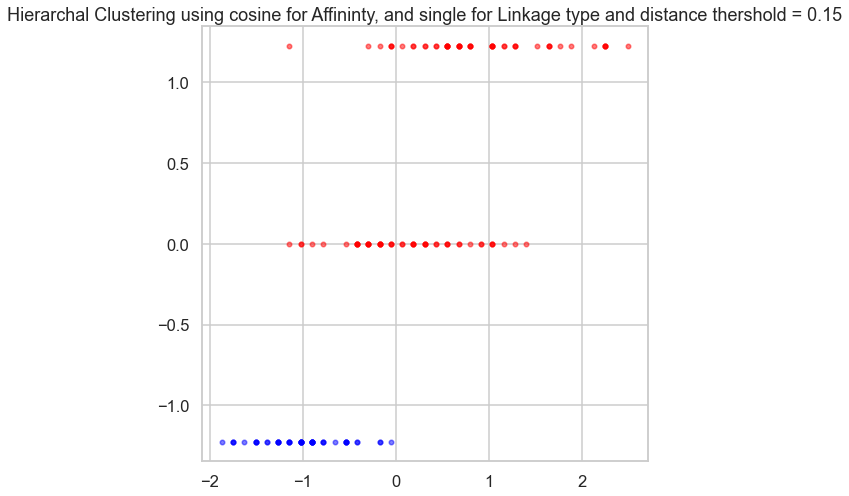

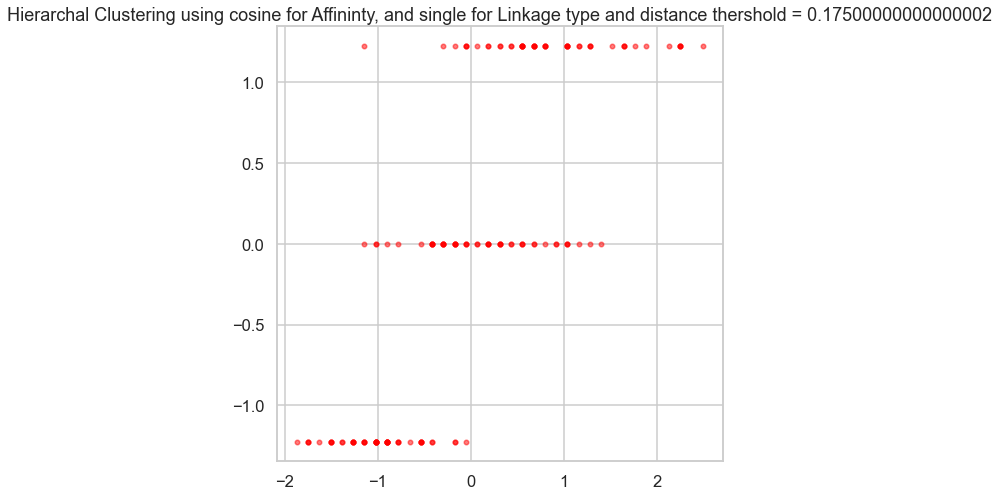

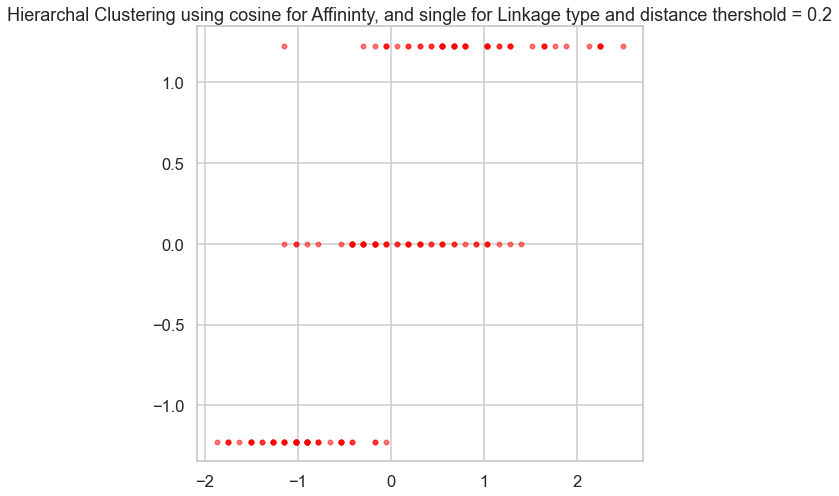

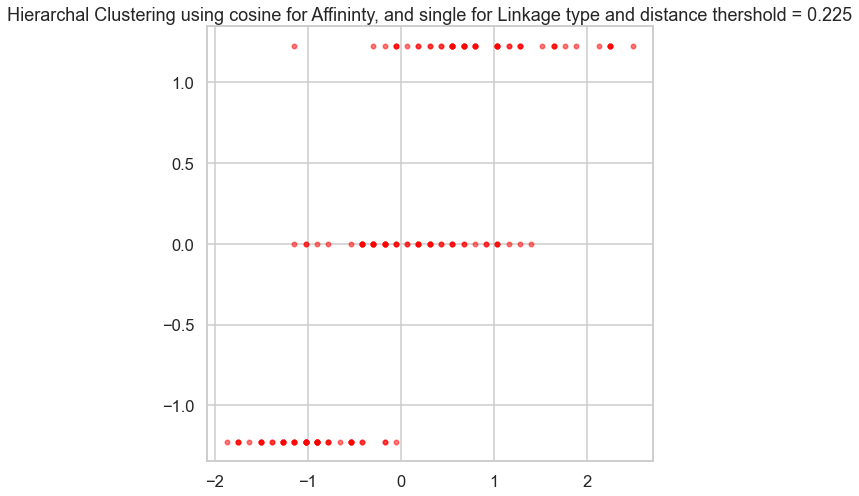

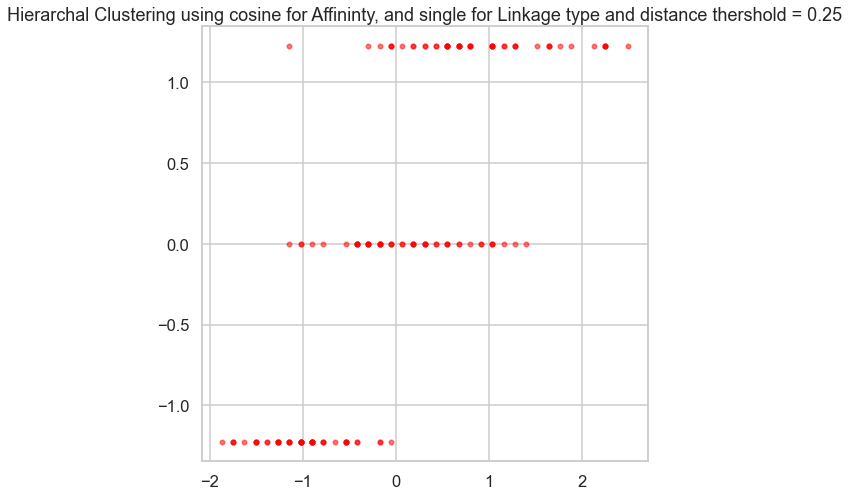

In [25]:
for aff in ['euclidean']:
    for link in ['average', 'single']:
        model = np.NaN
        if link == 'average':
            flag = True
            for dist in np.arange(0.5,2.5,0.5):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_iris_scaled)
                plot_Agglomerative(aff, link, float(dist), model, df_iris_scaled[['sepal length (cm)', 'target']], len(np.unique(model.labels_)), flag)
                flag = False
            
        elif link == 'single':
            flag = True
            for dist in np.arange(0.2,1.2,0.2):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_iris_scaled)
                plot_Agglomerative(aff, link, float(dist), model, df_iris_scaled[['sepal length (cm)', 'target']], len(np.unique(model.labels_)), flag)
                flag = False
                
for aff in ['cosine']:
    for link in ['average', 'single']:
        model = np.NaN
        if link == 'average':
            flag = True
            for dist in np.arange(0.25,1.0,0.25):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_iris_scaled)
                plot_Agglomerative(aff, link, float(dist), model, df_iris_scaled[['sepal length (cm)', 'target']], len(np.unique(model.labels_)), flag)
                flag = False
            
        elif link == 'single':
            flag = True
            for dist in np.arange(0.025,0.26,0.025):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_iris_scaled)
                plot_Agglomerative(aff, link, float(dist), model, df_iris_scaled[['sepal length (cm)', 'target']], len(np.unique(model.labels_)), flag)
                flag = False

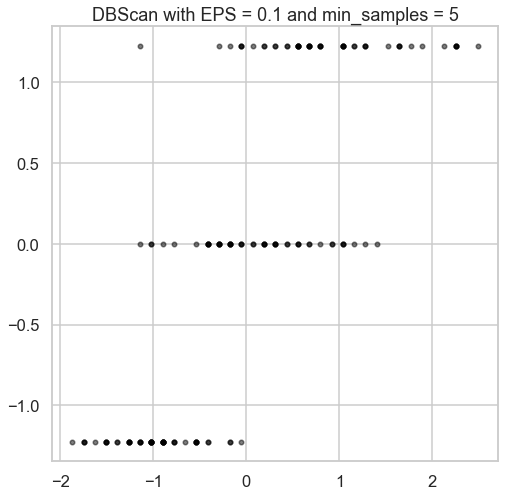

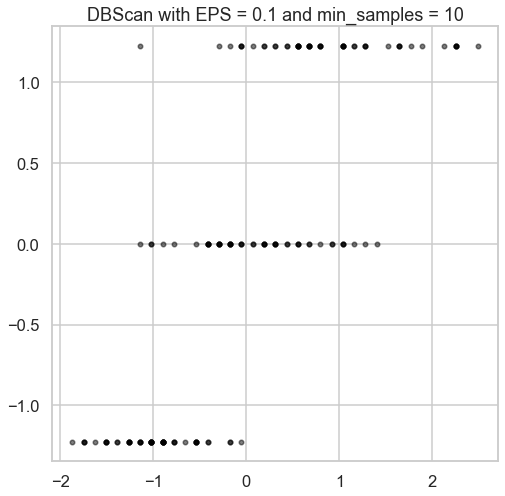

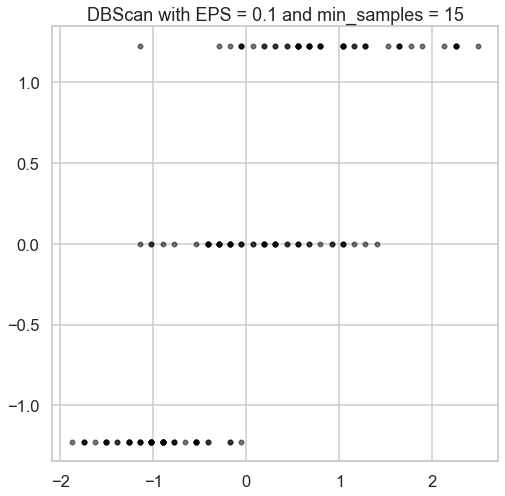

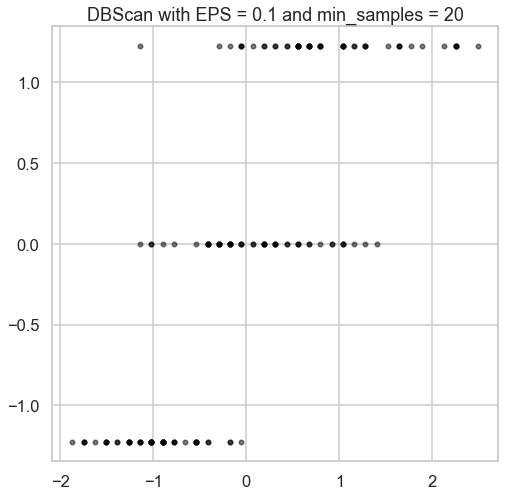

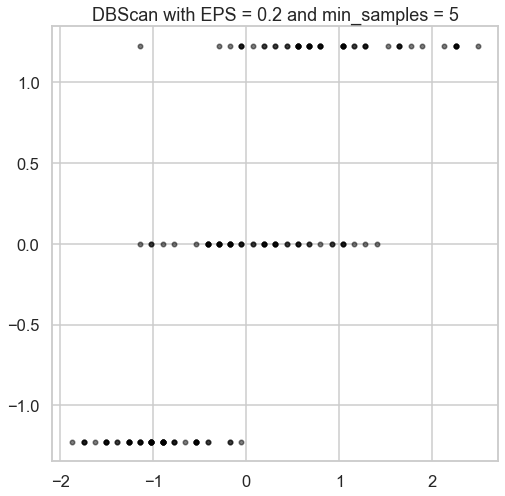

...

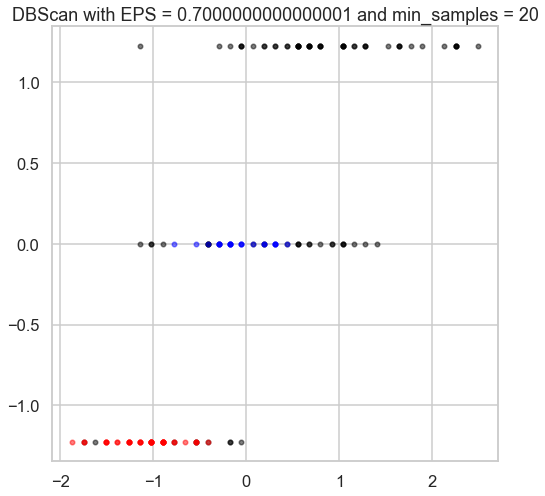

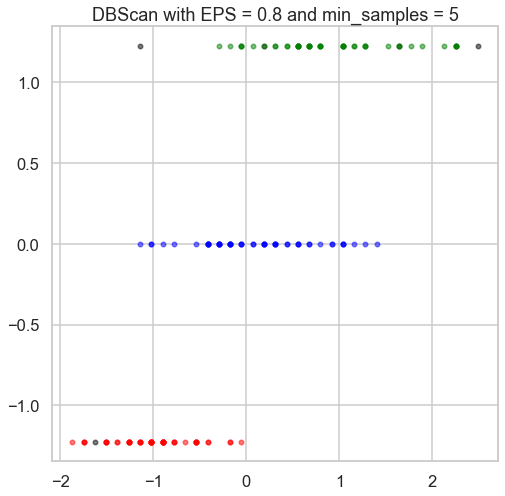

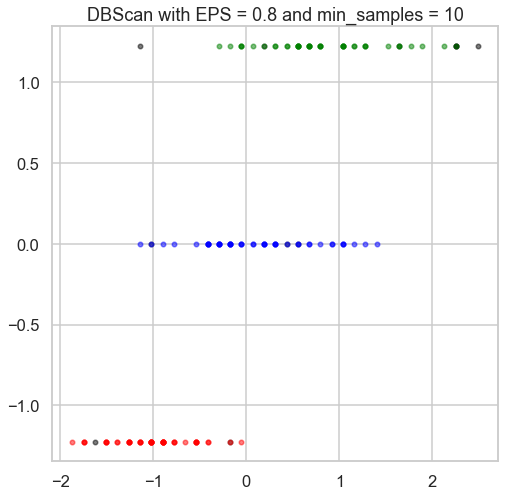

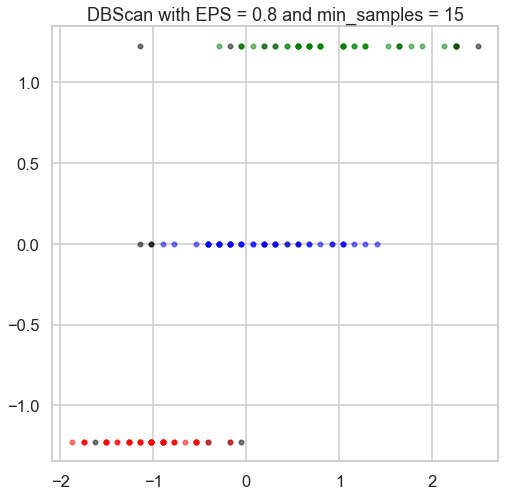

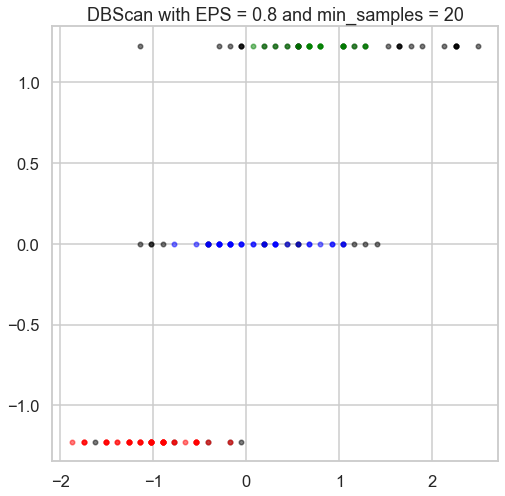

In [26]:
EPS_range = np.arange(0.1, 0.9, 0.1)
min_smaples_range = np.arange(5, 25, 5)

for EPS in EPS_range:
    for min_sample in min_smaples_range:
        dbscan = DBSCAN(eps=EPS, min_samples=min_sample)
        dbscan.fit(df_iris_scaled)
        
        plt.figure()
        plt.title(f'DBScan with EPS = {EPS} and min_samples = {min_sample}')
        display_cluster(df_iris_scaled[['sepal length (cm)', 'target']].to_numpy(copy=True), dbscan, 20)

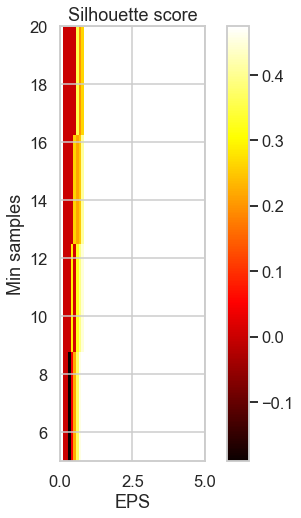

In [27]:
silhouette_scores = np.zeros((len(EPS_range), len(min_smaples_range)))

for i, eps in enumerate(EPS_range):
    for j, min_samples in enumerate(min_smaples_range):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(df_iris_scaled)
        if len(set(labels)) > 1:  # Silhouette score is undefined for a single cluster
            silhouette_scores[i, j] = silhouette_score(df_iris_scaled, labels)

# Create a heatmap of silhouette scores
fig, ax = plt.subplots()
plt.imshow(silhouette_scores.T, cmap='hot', interpolation='nearest', origin='lower', extent=[EPS_range[0], EPS_range[-1], min_smaples_range[0], min_smaples_range[-1]])
plt.colorbar()
plt.xlabel('EPS')
plt.ylabel('Min samples')
plt.title('Silhouette score')
ax.set_xlim([0, 5])
plt.show()

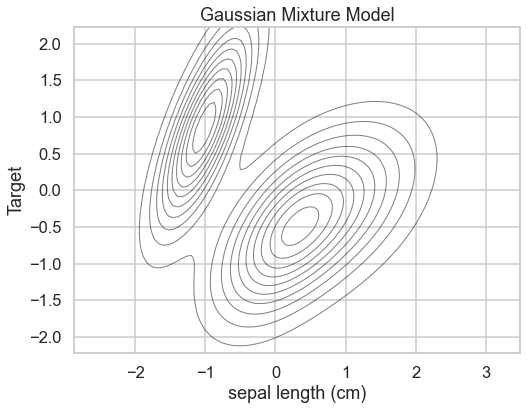

In [28]:
# Standardize data
scaler = StandardScaler()
X = scaler.fit_transform(df_iris)

# fit a Gaussian Mixture Model with 3 components
gmm = GaussianMixture(n_components=3)
gmm.fit(X)

# create a grid of points to evaluate the PDFs
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, -1].min() - 1, X[:, -1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# calculate the PDF of each component and the total mixture
Z = np.zeros((xx.shape[0], xx.shape[1]))
for i in range(gmm.n_components):
    # calculate the PDF of the i-th component
    mu = gmm.means_[i][:2]  # take the first two dimensions for plotting
    sigma = gmm.covariances_[i][:2, :2]  # take the first two dimensions for plotting
    rv = multivariate_normal(mu, sigma)
    Z += gmm.weights_[i] * rv.pdf(np.dstack((xx, yy)))

# plot the contours
plt.figure(figsize=(8, 6))
plt.contour(xx, yy, Z, levels=10, linewidths=1, colors='k', alpha=0.5)
plt.title('Gaussian Mixture Model')
plt.xlabel('sepal length (cm)')
plt.ylabel('Target')
plt.show()

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

## Customer dataset
Repeat all the above on the customer data set 

In [29]:
df_customers = pd.read_csv(r'E:\Intranet\Semester 10\(NETW 1013) Machine Learning\Assignments\Assignment 1\Assignment 1\Customer data.csv')
df_customers = df_customers.drop(labels=['ID'],axis='columns')

scaler = StandardScaler()
df_customers_scaled = pd.DataFrame(scaler.fit_transform(df_customers))
df_customers_scaled.columns = df_customers.columns

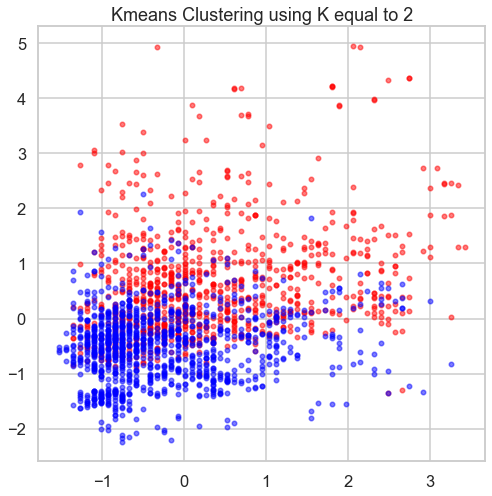

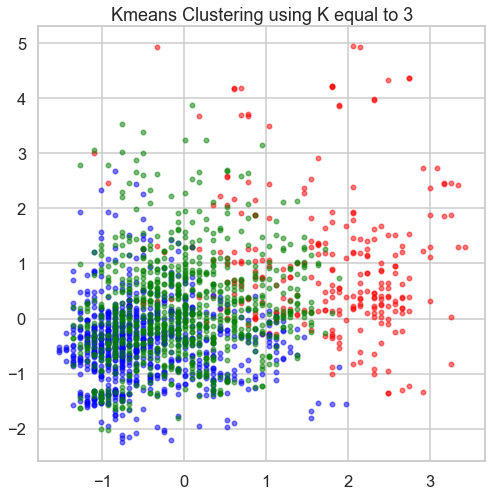

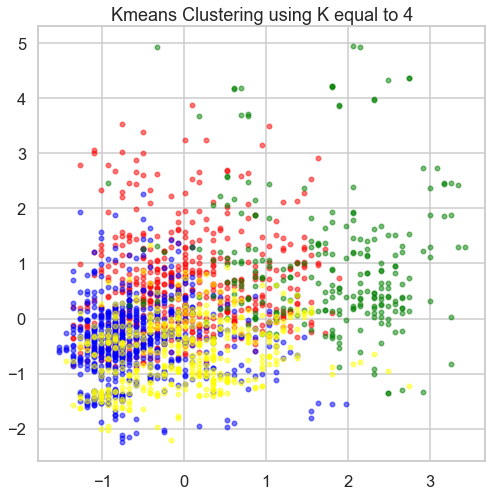

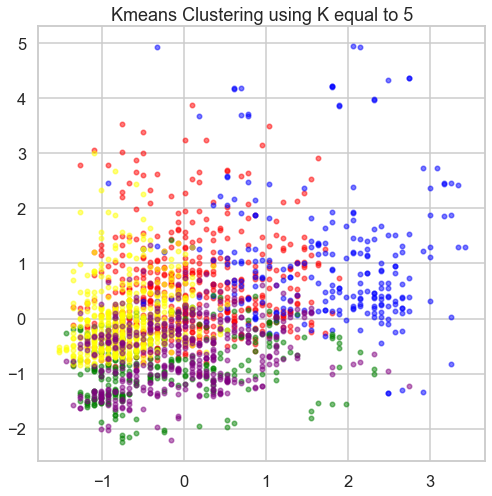

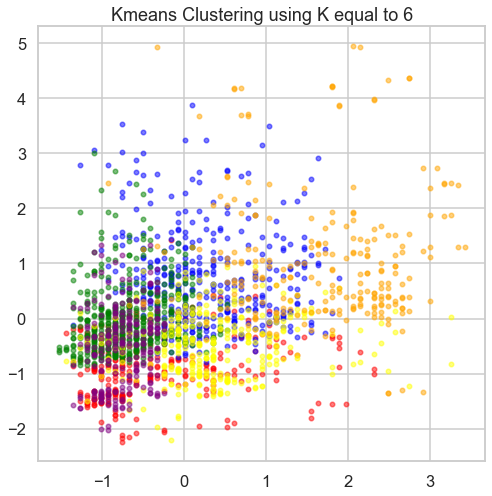

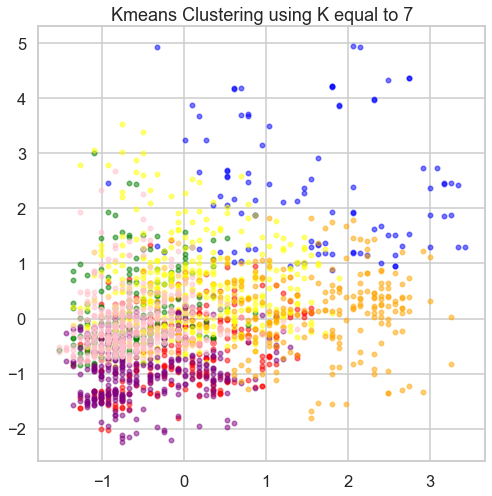

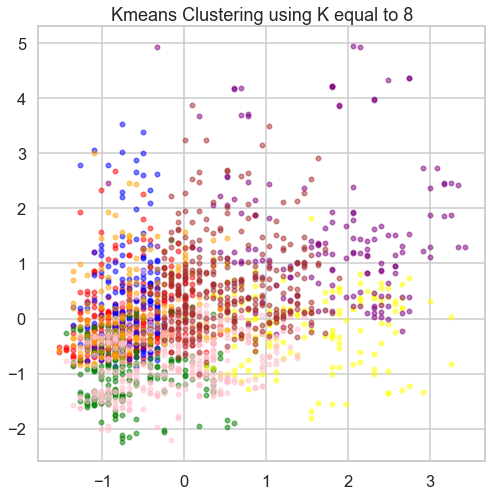

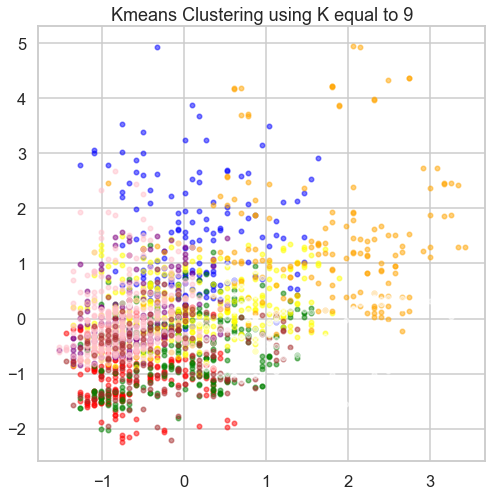

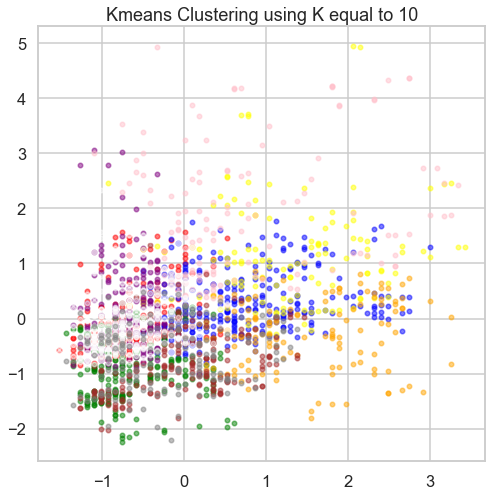

In [30]:
Kmeans_output = []

for i in range(2,11):
    km = GUC_Kmean(df_customers_scaled, i)
    
    plt.figure()
    plt.title(f'Kmeans Clustering using K equal to {i}')
    display_cluster(df_copy[['Age', 'Income']].to_numpy(copy=True), km, i)
    
    Kmeans_output.append(km)

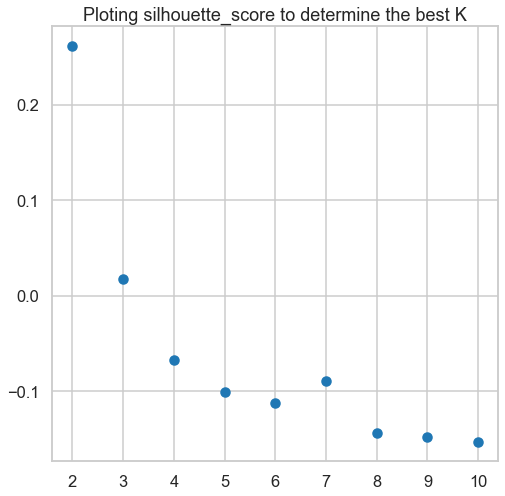

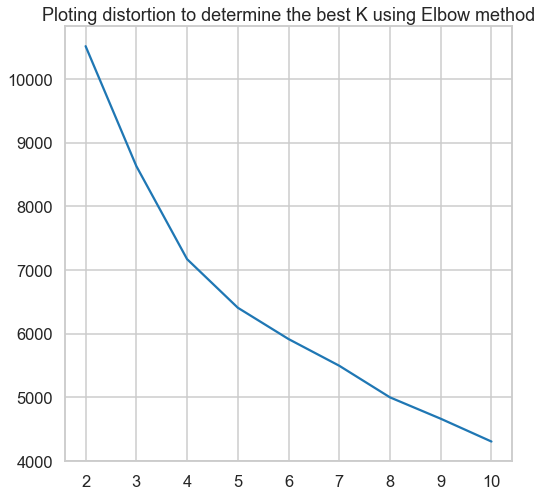

In [31]:
distortion = []
sil_score = []

for i in range(2,11):
    sil_score.append(silhouette_score(df_customers, Kmeans_output[i-2].labels_))
    distortion.append(Kmeans_output[i-2].inertia_)

plt.figure()
plt.title(f'Ploting silhouette_score to determine the best K')
plt.scatter(range(2,11), sil_score)

plt.figure()
plt.title('Ploting distortion to determine the best K using Elbow method')
plt.plot(range(2,11), distortion)

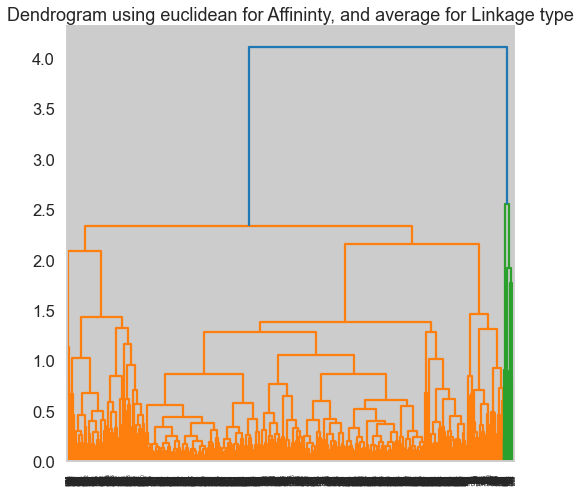

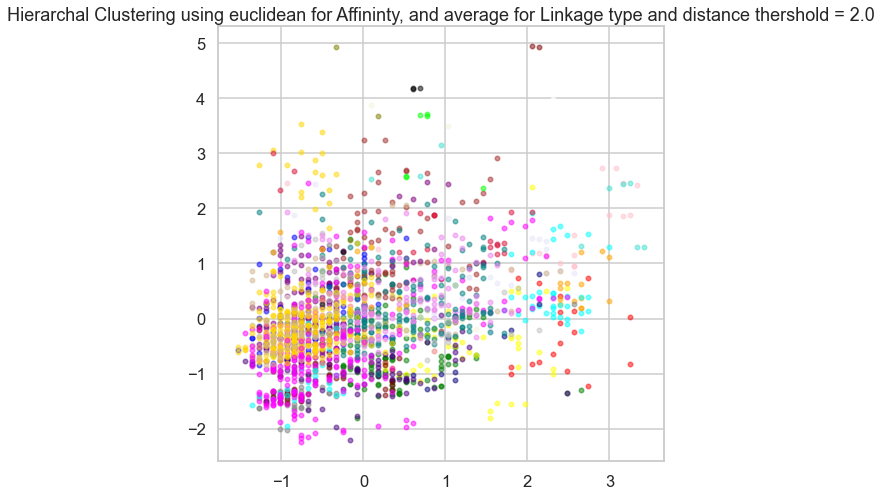

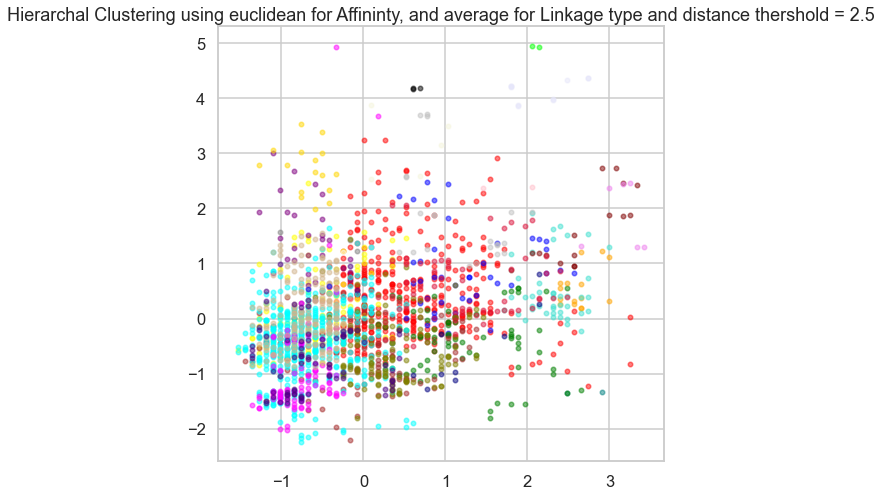

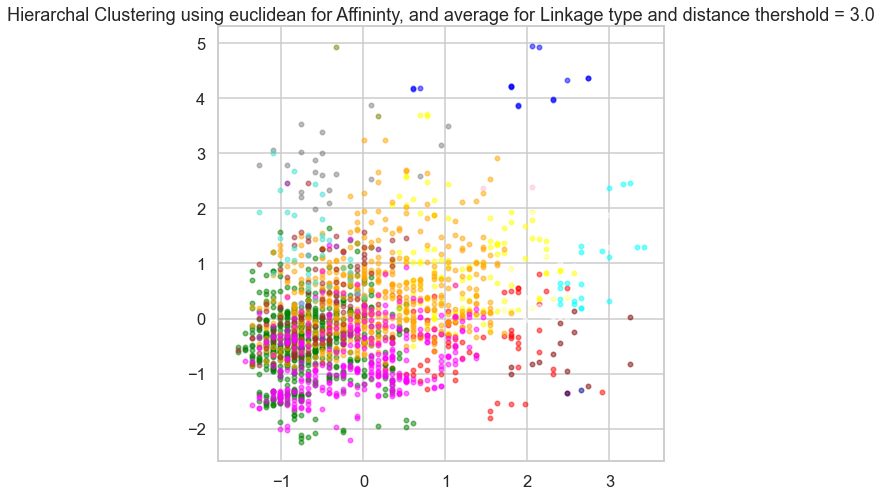

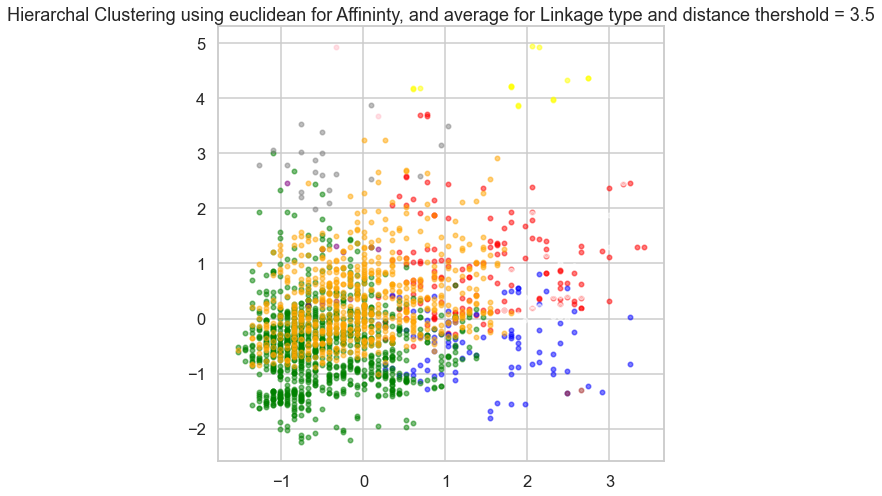

...

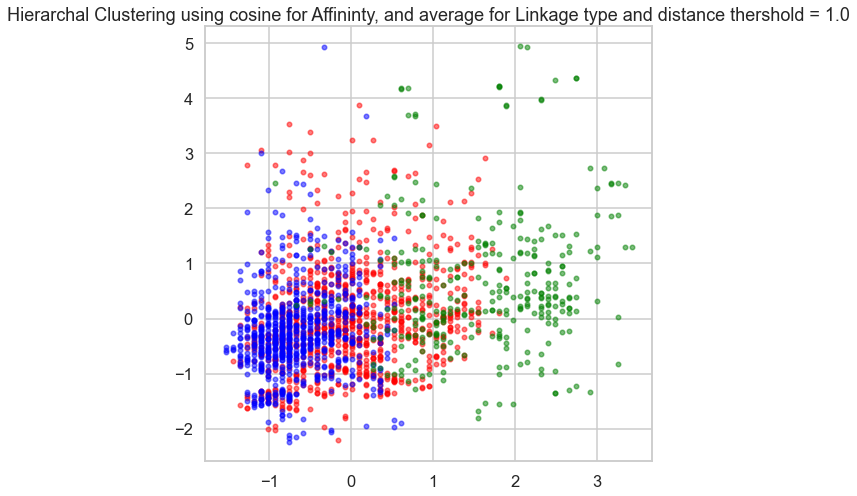

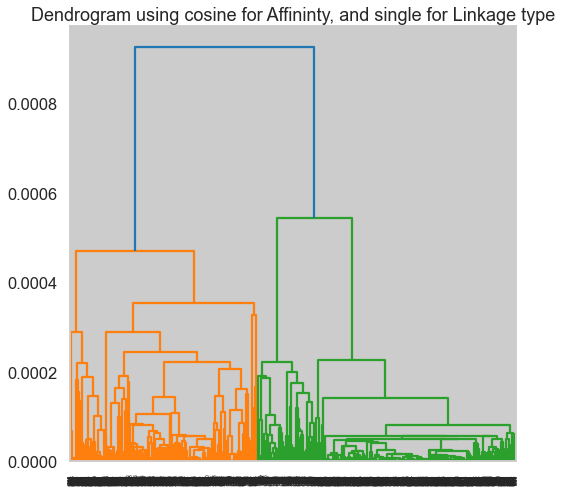

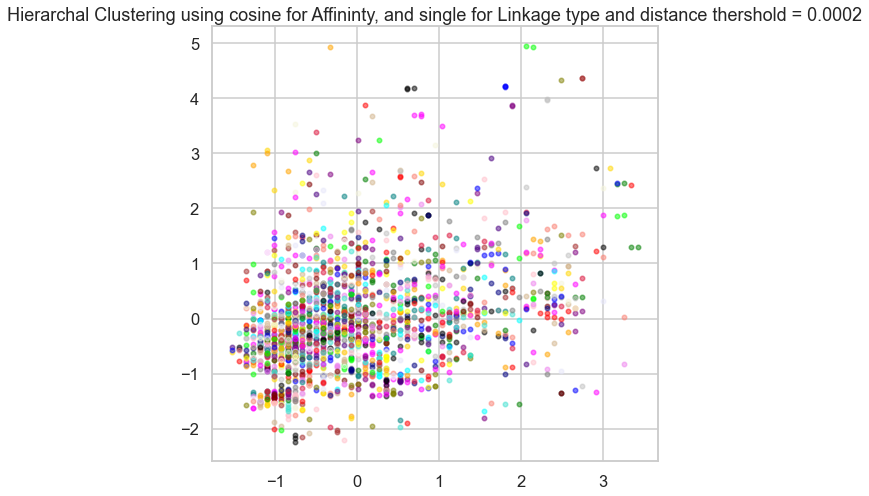

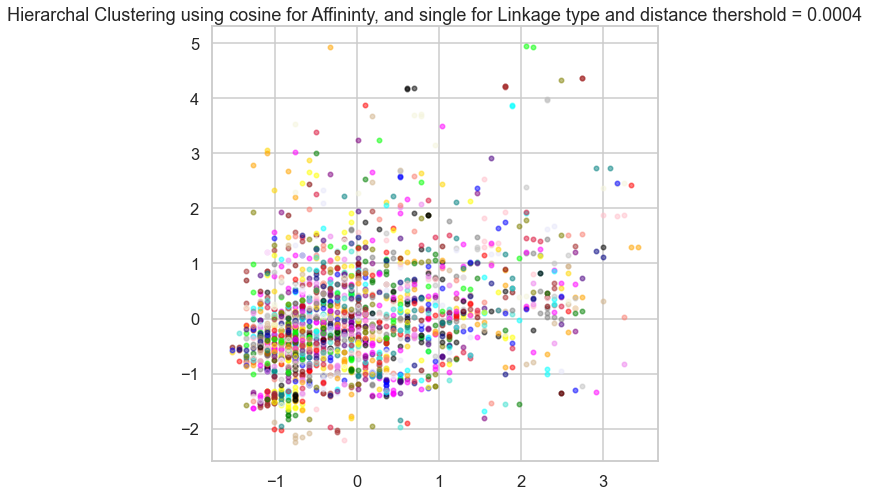

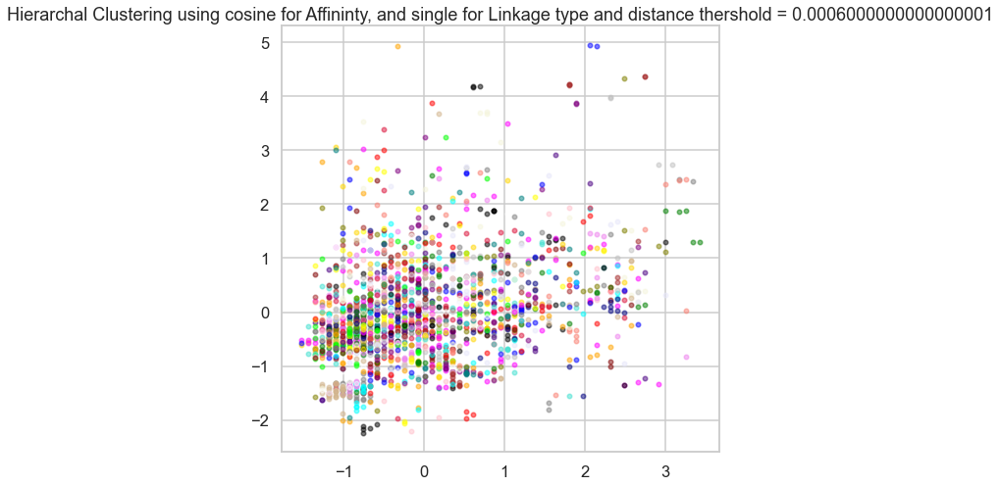

In [32]:
for aff in ['euclidean']:
    for link in ['average', 'single']:
        model = np.NaN
        if link == 'average':
            flag = True
            for dist in np.arange(2,4.5,0.5):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_customers_scaled)
                plot_Agglomerative(aff, link, float(dist), model, df_customers_scaled[['Age', 'Income']], len(np.unique(model.labels_)), flag)
                flag = False
            
        elif link == 'single':
            flag = True 
            for dist in np.arange(0.2,1.2,0.2):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_customers_scaled)
                plot_Agglomerative(aff, link, float(dist), model, df_customers_scaled[['Age', 'Income']], len(np.unique(model.labels_)), flag)
                flag = False
                
for aff in ['cosine']:
    for link in ['average', 'single']:
        model = np.NaN
        if link == 'average':
            flag = True
            for dist in np.arange(0.2,1.2,0.2):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_customers_scaled)
                plot_Agglomerative(aff, link, float(dist), model, df_customers_scaled[['Age', 'Income']], len(np.unique(model.labels_)), flag)
                flag = False
            
        elif link == 'single':
            flag = True 
            for dist in np.arange(0.0002,0.0008,0.0002):
                model = AgglomerativeClustering(n_clusters=None, compute_full_tree=True, linkage=link, affinity=aff, distance_threshold=dist)
                model.fit(df_customers_scaled)
                plot_Agglomerative(aff, link, float(dist), model, df_customers_scaled[['Age', 'Income']], len(np.unique(model.labels_)), flag)
                flag = False

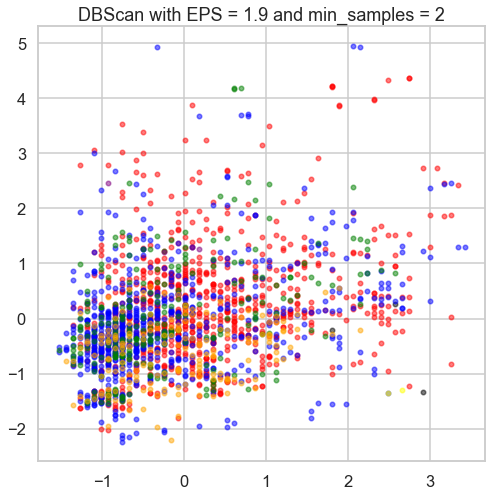

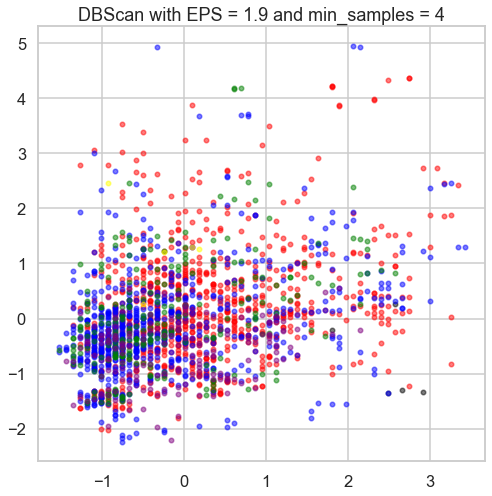

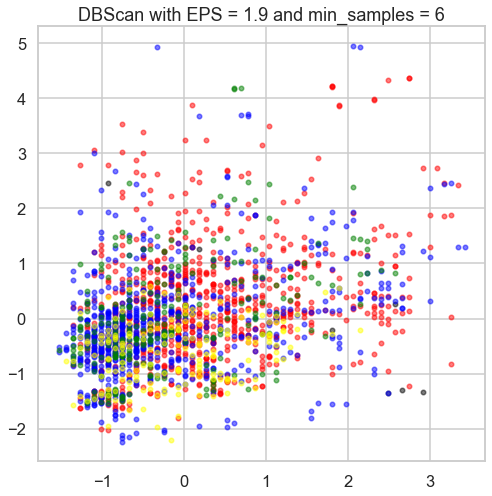

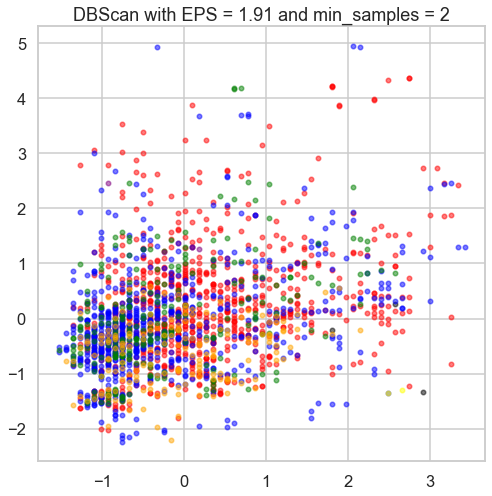

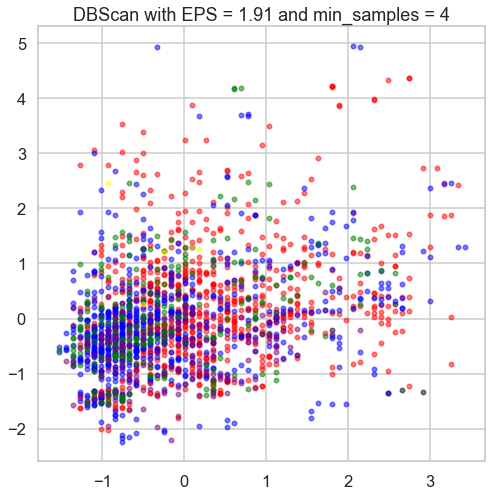

...

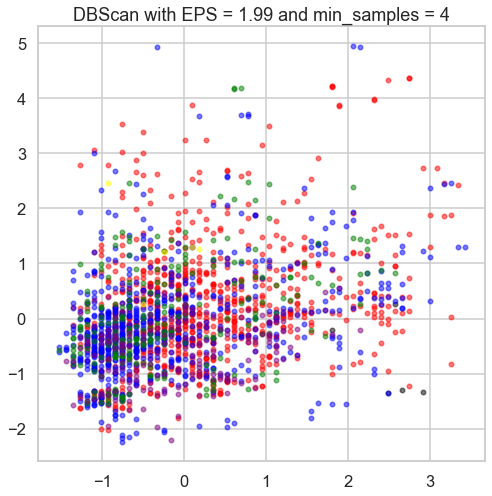

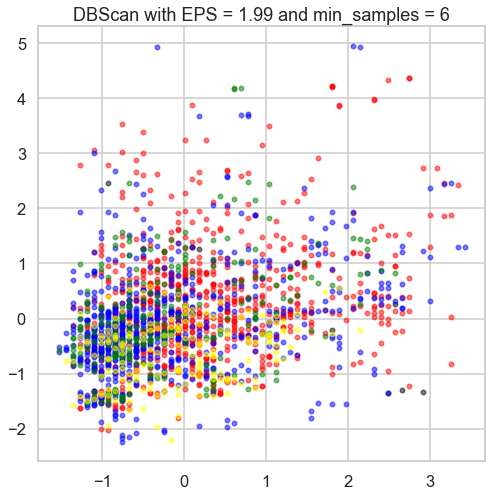

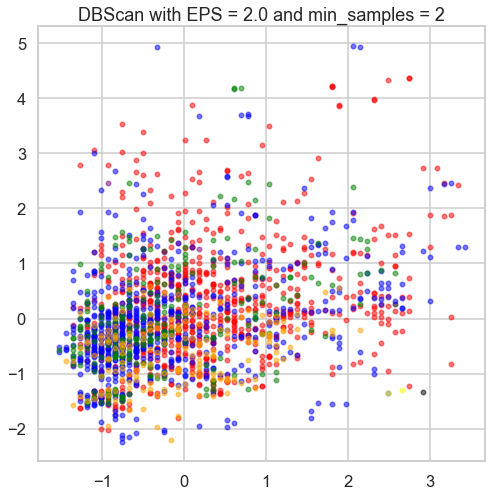

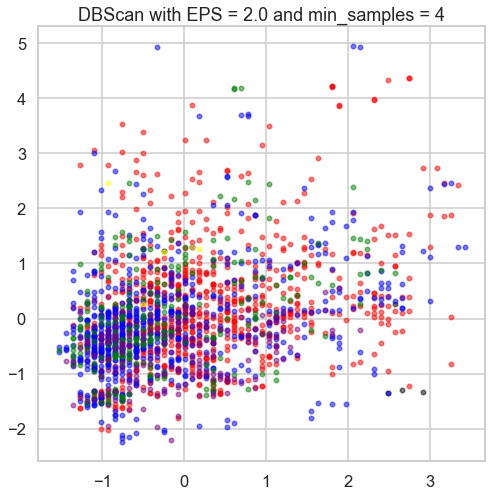

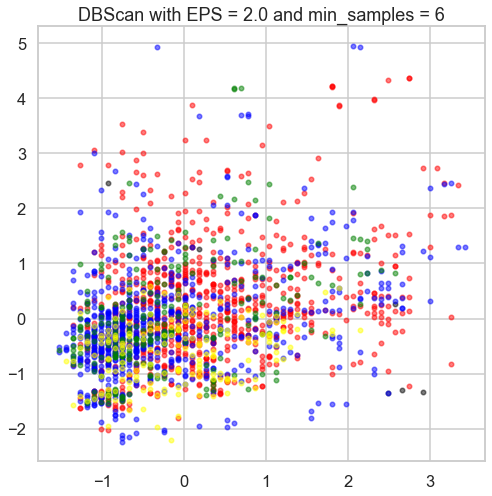

In [33]:
EPS_range = np.arange(1.9, 2.01, 0.01)
min_smaples_range = np.arange(2, 8, 2)

for EPS in EPS_range:
    for min_sample in min_smaples_range:
        dbscan = DBSCAN(eps=EPS, min_samples=min_sample)
        dbscan.fit(df_customers_scaled)
        
        plt.figure()
        plt.title(f'DBScan with EPS = {EPS} and min_samples = {min_sample}')
        display_cluster(df_customers_scaled[['Age', 'Income']].to_numpy(copy=True), dbscan, 20)

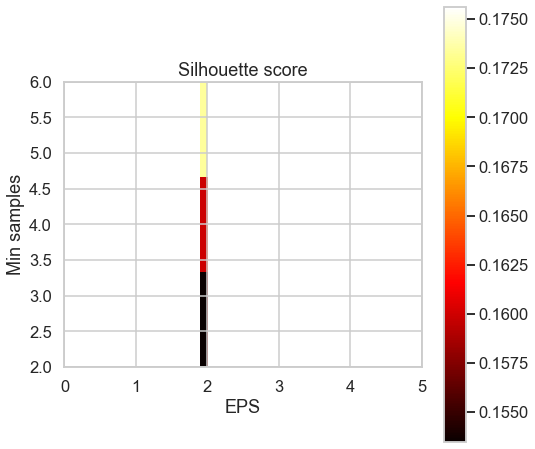

In [34]:
silhouette_scores = np.zeros((len(EPS_range), len(min_smaples_range)))

for i, eps in enumerate(EPS_range):
    for j, min_samples in enumerate(min_smaples_range):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(df_customers_scaled)
        if len(set(labels)) > 1:  # Silhouette score is undefined for a single cluster
            silhouette_scores[i, j] = silhouette_score(df_customers_scaled, labels)

# Create a heatmap of silhouette scores
fig, ax = plt.subplots()
plt.imshow(silhouette_scores.T, cmap='hot', interpolation='nearest', origin='lower', extent=[EPS_range[0], EPS_range[-1], min_smaples_range[0], min_smaples_range[-1]])
plt.colorbar()
plt.xlabel('EPS')
plt.ylabel('Min samples')
plt.title('Silhouette score')
ax.set_xlim([0, 5])
plt.show()

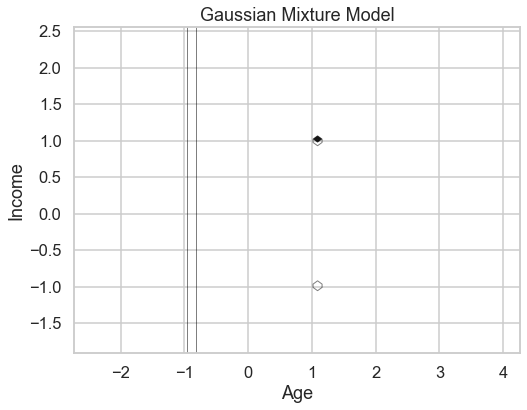

In [35]:
# Standardize data
scaler = StandardScaler()
X = scaler.fit_transform(df_customers_scaled)

gmm = GaussianMixture(n_components=3)
gmm.fit(X)

# create a grid of points to evaluate the PDFs
x_min, x_max = df_customers_scaled.to_numpy(copy=True)[:, 3].min() - 1, df_customers_scaled.to_numpy(copy=True)[:, 3].max() + 1
y_min, y_max = df_customers_scaled.to_numpy(copy=True)[:, -1].min() - 1, df_customers_scaled.to_numpy(copy=True)[:, -1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))

# calculate the PDF of each component and the total mixture
Z = np.zeros((xx.shape[0], xx.shape[1]))
for i in range(gmm.n_components):
    # calculate the PDF of the i-th component
    mu = gmm.means_[i][:2]  # take the first two dimensions for plotting
    sigma = gmm.covariances_[i][:2, :2]  # take the first two dimensions for plotting
    rv = multivariate_normal(mu, sigma)
    Z += gmm.weights_[i] * rv.pdf(np.dstack((xx, yy)))

# plot the contours
plt.figure(figsize=(8, 6))
plt.contour(xx, yy, Z, levels=10, linewidths=1, colors='k', alpha=0.5)
plt.title('Gaussian Mixture Model')
plt.xlabel('Age')
plt.ylabel('Income')
plt.show()

# PCA

In [36]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2,whiten=True)
Multi_blob_Data_pca = pca.fit_transform(pd.DataFrame(Multi_blob_Data))

print(pca.explained_variance_ratio_)
print(pd.DataFrame(Multi_blob_Data_pca))

[0.78084622 0.21915378]
             0         1
0    -1.780397 -1.378500
1    -1.486384 -0.634975
2    -1.978708 -1.211271
3    -1.368945 -1.264190
4    -1.918067 -0.774640
...        ...       ...
1445  1.236877 -1.582670
1446  1.915680 -0.367096
1447  2.578393  2.031976
1448  1.283295  1.653810
1449  1.583525  0.079190

[1450 rows x 2 columns]


In [37]:
pca = PCA(n_components=1,whiten=True)
df_iris_pca = pca.fit_transform(df_iris)

print(pca.explained_variance_ratio_)
print(pd.DataFrame(df_iris_pca))

[0.92264373]
            0
0   -1.302672
1   -1.314779
2   -1.388852
3   -1.327592
4   -1.321510
..        ...
145  0.987921
146  0.811444
147  0.911646
148  0.970176
149  0.753534

[150 rows x 1 columns]


In [38]:
pca = PCA(n_components=4,whiten=True)
df_customers_scaled_pca = pca.fit_transform(df_customers_scaled)

print(np.sum(pca.explained_variance_ratio_))
print(pca.explained_variance_ratio_)
print(pd.DataFrame(df_customers_scaled_pca))

0.8832611508521915
[0.35696328 0.26250923 0.18821114 0.0755775 ]
             0         1         2         3
0     1.590467  0.615177  1.894263  1.673864
1     0.218157  0.441141 -1.926313  0.753758
2    -0.411769 -0.501578  1.986252  0.165869
3     1.084230 -0.427704  0.636469 -0.702032
4     1.028845 -0.324871  1.084320 -0.318621
...        ...       ...       ...       ...
1995 -0.547729  0.220023  1.253337 -1.300166
1996 -0.705162  0.586122 -0.940571 -1.012688
1997 -0.918515 -1.649034  0.780916 -0.181124
1998 -1.417621  0.462501 -0.462029 -0.058562
1999 -1.180723 -1.810354  0.577146  0.138681

[2000 rows x 4 columns]


# KNN

In [39]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score

# Load the iris dataset
iris = load_iris()

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(iris.data, iris.target, test_size=0.3, random_state=42)

# Create a KNN classifier with k=3
knn = KNeighborsClassifier(n_neighbors=3)

# Train the classifier using cross-validation
cv_scores = cross_val_score(knn, X_train, y_train, cv=5)

# Print the cross-validation scores
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean accuracy: {cv_scores.mean()}")

# Train the classifier on the full training data
knn.fit(X_train, y_train)

# Use the classifier to make predictions on the test data
y_pred = knn.predict(X_test)

# Compute the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Cross-validation scores: [0.9047619  0.9047619  0.9047619  1.         0.95238095]
Mean accuracy: 0.9333333333333333
Accuracy: 1.0
